In [1]:
from ipynb.fs.full.Funciones_basicas import *
from ipynb.fs.full.Algoritmos import *
from ipynb.fs.full.Visualizaciones import *

ModuleNotFoundError: No module named 'ipynb.fs.full.Funciones_basicas'

#### Inicializamos grafos

In [5]:
path = 'data/graph_geom_corrected_cycles.csv'
csv_grafo = pd.read_csv(path, sep=';')

# path ='data/corrected_dijkstra.csv'
# csv_grafo = pd.read_csv(path)


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])
        
        
###################################################################################################

        
path = 'data/corrected_dijkstra.csv'
csv_grafo = pd.read_csv(path, sep=',')

path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

T = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        T.add_edge(id_[origin], id_[dest])
    
N = l

W = [0] * N

for u in range(N):
    if pesos[pesos['ID_tapa'] == _id[u]].shape[0] >= 1:  ## tomamos primera columna con el id, si no hay peso = 0
        W[u] = pesos[pesos['ID_tapa'] == _id[u]].iloc[0]['per_predio']

## Funciones robustas

In [2]:
root = 744
# Nodo de planta (nodo de mayor ideal normal)

def get_size_robust(G, V_, node):
    
    N = len(V_)
    
    if V_[node]:
        return 0
    
    if node == root:
        return N - sum(V_)
    
    V = [0] * N
    
    V[root] = 1; Q = deque([root]);
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                V[v] = 1
                Q.append(v)

    return sum([1 for u in range(N) if V_[u] + V[u] == 0])

def get_ideal_robust(G, V_, root, node):
    
    if root == node:
        return get_ideal(G, V_, root)
    
    N = len(V_)
    V = [0] * N
    V[root] = 1
    Q = deque([root])
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                V[v] = 1
                Q.append(v)

    return [i for i in range(N) if (V_[i] == 0 and V[i] == 0)]

                
def deactivate_robust(G, V_, node):
    N = len(V_)
    V = [0] * N
    V[root] = 1; Q = deque([root]);
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                V[v] = 1
                Q.append(v)

    return [0 if V_[u] + V[u] == 0 else 1 for u in range(N)]


# def add_visit_robust(G, V, node):
#     N = len(V)
#     V_ = [0 for u in V]
#     V[node] += 1
#     Q = deque([]); Q.append(root)
#     while Q:
#         u = Q.popleft()
#         for v in G.predecessors(u):
#             if not V_[v] and v != node:
#                 V_[v] = 1
#                 Q.append(v)
#     return [1 if (V_[i] == 0 and V[i] == 0) else V[i] for i in range(N)]

def add_visit_robust(G, V, root, node):
    N = len(V)
    V[node] = 1
    I = get_ideal_robust(G, V, root, node)
    return [1 if (i in I or V[i]) else 0 for i in range(N) ]


def get_size_weight_robust(G, W, V_, node):
    N = len(V_)
    
    if V_[node]:
        return 0 , 0
    
    if node == root:
        return N - sum(V_), sum(W) - sum([W[i] for i in range(N) if V_[i]])
    
    V = [0] * N
    
    V[root] = 1; Q = deque([root]);
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                V[v] = 1
                Q.append(v)
                
    I = [i for i in range(N) if (V_[i] == 0 and V[i] == 0)]
    return sum([1 for i in I]), sum([W[i] for i in I])


def get_size_precalc_robust(G, W, V_, node):
    
    N = len(V_)
    
    if V_[node]:
        return 0
    
    if W[node] <= 200:
        return 1
    
    V = [0] * N
    
    s = 1; V[node] = 1
    Q = deque([]); Q.append(root)
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                s += 1; V[v] = 1
                Q.append(v)
                
    return sum([1 for i in range(N) if (V_[i] == 0 and V[i] == 0 and W[i] > 200) ])

def greedyAppReduceDynamic_robust(G, W, V_, K, limit, wlim):
    
    V = V_.copy(); N = len(V)
    E = {u for u in range(N) if not V[u]}

    ans = []; tot = 0
    while len(ans) < K:
        
        S = [0 for u in range(N)]
        for v in E:
            _, S[v] = get_size_weight_robust(G, W, V, v)
            #_, S[v] = get_size_weight(G, W, V, v)
        
        maxv = 0; u = -1
        for v in E:
            s = get_size_precalc(G, S, V, v)
            #s = get_size_precalc_robust(G, S, V, v)
            if s > maxv and s <= limit and S[v] <= wlim:
                u = v
                maxv = s
        if u == -1:
            break
        
            
        V = add_visit_robust(G, V, u)
        ans.append(u)
        E.remove(u)
        
    return ans, 0

def hist_results(T):
    
    mx = max(T)
    bins = [b - 0.5 for b in range(1, mx + 1)]

    plt.figure(figsize=(10, 5))
    plt.hist(T, bins=bins)
    plt.xticks([b for b in range(1, mx + 1)])
    plt.xlim([0.5, mx + .5])
    plt.show()

In [475]:
low = 0; high = N
while low != high:
    mid = (low + high) // 2
    P, sP = greedyAppReduceDynamic(G, W, [0] * N, 8, mid, 1e8)
    if N - sP < mid:
        high = mid
    else:
        low = mid + 1
init_P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

### Simulación no robusta grafo original

In [207]:
path = 'data/graph_geom_corrected_cycles.csv'
csv_grafo = pd.read_csv(path, sep=';')


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])

In [913]:
import random

iters = []
S = random.sample(range(N), 50)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(G, W, V, 5, 1, 1e8)
            
#         print(R, len(P), sP)
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                s = u; break
            else:
                V, _ = visit(G, V, u)

        size, weight = get_size_weight(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / (r + 1)}")
            break
        if t == 99:
            iters.append(100)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / (r + 1)}")
            
print(sum(iters) / len(iters), max(iters))

Result 1444: 4    acc: 0.002768166089965398
Result 655: 4    acc: 0.012195121951219513
Result 145: 4    acc: 0.0821917808219178
Result 607: 4    acc: 0.02631578947368421
Result 962: 3    acc: 0.01973001038421599
Result 1030: 3    acc: 0.02133850630455868
Result 1592: 4    acc: 0.016321406151914627
Result 2394: 5    acc: 0.012943632567849687
Result 1144: 3    acc: 0.029694323144104803
Result 3879: 4    acc: 0.00979381443298969
Result 3599: 3    acc: 0.01138888888888889
Result 912: 3    acc: 0.04819277108433735
Result 3708: 4    acc: 0.012941493664060394
Result 4355: 3    acc: 0.011707988980716254
Result 1440: 4    acc: 0.03816793893129771
Result 4235: 4    acc: 0.01392823418319169
Result 1697: 4    acc: 0.037102473498233215
Result 4548: 4    acc: 0.014728511760826556
Result 4076: 4    acc: 0.01741476575913662
Result 3963: 4    acc: 0.018920282542885972
Result 4415: 5    acc: 0.018115942028985508
Result 3597: 4    acc: 0.023346303501945526
Result 3022: 3    acc: 0.02877935825339067
Resul

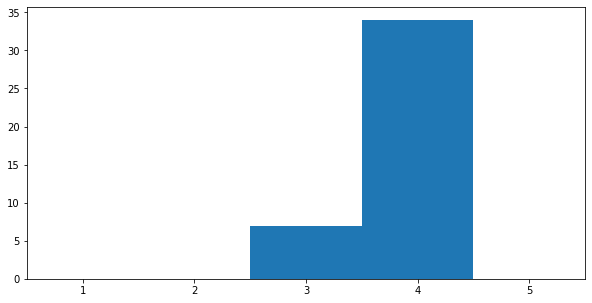

In [914]:
hist_results(iters)

In [7]:
def get_size_weight_robust(G, W, V_, node):
    N = len(V_)
    
    if V_[node]:
        return 0 , 0
    
    if node == root:
        return N - sum(V_), sum(W) - sum([W[i] for i in range(N) if V_[i]])
    
    V = [0] * N
    
    V[root] = 1; Q = deque([root]);
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                V[v] = 1
                Q.append(v)
                
    I = [i for i in range(N) if (V_[i] == 0 and V[i] == 0)]
    return sum([1 for i in I]), sum([W[i] for i in I])


def get_size_precalc_robust(G, W, V_, node):
    
    N = len(V_)
    
    if V_[node]:
        return 0
    
    if W[node] <= 200:
        return 1
    
    V = [0] * N
    
    s = 1; V[node] = 1
    Q = deque([]); Q.append(root)
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if not V[v] and v != node:
                s += 1; V[v] = 1
                Q.append(v)
                
    return sum([1 for i in range(N) if (V_[i] == 0 and V[i] == 0 and W[i] > 200) ])

### Busqueda robusta en grafo original

In [344]:
path = 'data/graph_geom_corrected_cycles.csv'
csv_grafo = pd.read_csv(path, sep=';')


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])

In [345]:
# low = 0; high = N
# while low != high:
#     mid = (low + high) // 2
#     P, sP = greedyAppReduceDynamic(G, W, [0] * N, 8, mid, 1e8)
#     if N - sP < mid:
#         high = mid
#     else:
#         low = mid + 1
low = 372
init_P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

Result 1129: 4    acc: 4.0
Result 2349: 5    acc: 4.5
Result 635: 6    acc: 5.0
Result 3704: 7    acc: 5.5
Result 4110: 6    acc: 5.6
Result 3208: 7    acc: 5.833333333333333
Result 4161: 5    acc: 5.714285714285714
Result 4519: 6    acc: 5.75
Result 1195: 5    acc: 5.666666666666667
Result 98: 6    acc: 5.7
Result 1159: 5    acc: 5.636363636363637
Result 3100: 6    acc: 5.666666666666667
Result 4479: 5    acc: 5.615384615384615
Result 3438: 6    acc: 5.642857142857143
Result 3544: 5    acc: 5.6
Result 946: 6    acc: 5.625
Result 4387: 6    acc: 5.647058823529412
Result 2472: 6    acc: 5.666666666666667
Result 796: 5    acc: 5.631578947368421
Result 828: 6    acc: 5.65
Result 4184: 5    acc: 5.619047619047619
Result 677: 6    acc: 5.636363636363637
Result 2622: 5    acc: 5.608695652173913
Result 2004: 5    acc: 5.583333333333333
Result 1360: 5    acc: 5.56
Result 1266: 6    acc: 5.576923076923077
Result 865: 5    acc: 5.555555555555555
Result 1786: 6    acc: 5.571428571428571
Result 96

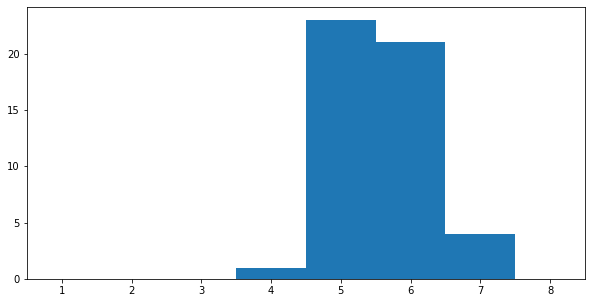

In [346]:
import random

root = 743
iters = []; positions = []; dif = []
S = random.sample(range(N), 50)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(G, W, V, 5, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        V_ = V.copy()
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                
                I_ = set(get_ideal(G, V_, u)[::-1])
                V_ = [not (v in I_) for v in range(N)]
                s = u; break
            else:
                V = add_visit_robust(G, V, u)
                add_visit(G, V_, u)
                
        down = sum([1 - V_[u] for u in range(N)])
        up = sum([1 - V[u] for u in range(N)])
        dif.append(((up - down) / down, t))
        

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))
hist_results(iters)

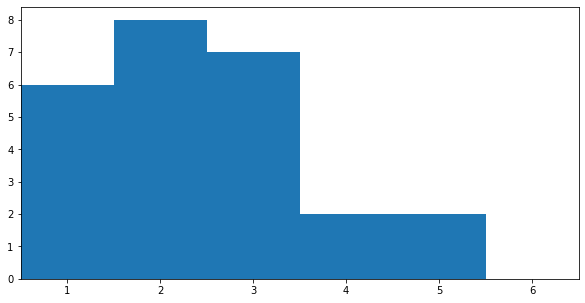

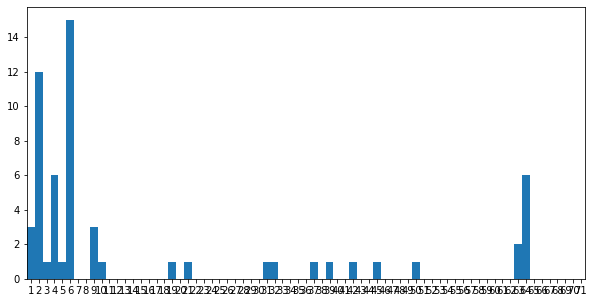

Diferencia relativa promedio: 9.9%
Porcentaje de veces que es el mismo resultado: 75.1%


In [347]:
etapas = [i[1] for i in dif]
etapas_malas = [i[1] for i in dif if i[0] > 0.2]
hist_results(etapas_malas)
dif_ = [i[0] for i in dif]
hist_results([round(100 * i) for i in dif_ if i < 1])
print(f'Diferencia relativa promedio: {round(sum(dif_)/len(dif_) * 100, 1)}%')
print(f'Porcentaje de veces que es el mismo resultado: {round(dif_.count(0)/len(dif_) * 100, 1)}%')

### Busqueda robusta en Arbol

In [968]:
path ='data/corrected_dijkstra.csv'
csv_grafo = pd.read_csv(path)


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])

In [969]:
low = 0; high = N
while low != high:
    mid = (low + high) // 2
    P, sP = greedyAppReduceDynamic(G, W, [0] * N, 8, mid, 1e8)
    if N - sP < mid:
        high = mid
    else:
        low = mid + 1
init_P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

In [970]:
iters = []; positions = []
S = random.sample(range(N), 50)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(G, W, V, 5, 1, 1e8)
            
#         print(R, len(P), sP)
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        for u in P[::-1]:
            if CV[u]:
                #I = set(get_ideal_robust(G, V, u)[::-1])
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                s = u; break
            else:
                #V, _ = visit(G, V, u)
                V = add_visit_robust(G, V, u)

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))

Result 460: 4    acc: 4.0
Result 442: 5    acc: 4.5
Result 2528: 4    acc: 4.333333333333333
Result 1376: 4    acc: 4.25
Result 2595: 4    acc: 4.2
Result 766: 5    acc: 4.333333333333333
Result 1500: 4    acc: 4.285714285714286
Result 3229: 4    acc: 4.25
Result 4528: 5    acc: 4.333333333333333
Result 1780: 4    acc: 4.3
Result 2105: 3    acc: 4.181818181818182
Result 1801: 5    acc: 4.25
Result 1670: 4    acc: 4.230769230769231
Result 1794: 4    acc: 4.214285714285714
Result 1614: 4    acc: 4.2
Result 4090: 4    acc: 4.1875
Result 2964: 4    acc: 4.176470588235294
Result 4252: 4    acc: 4.166666666666667
Result 2846: 4    acc: 4.157894736842105
Result 3222: 4    acc: 4.15
Result 2140: 4    acc: 4.142857142857143
Result 3908: 5    acc: 4.181818181818182
Result 3185: 4    acc: 4.173913043478261
Result 3884: 4    acc: 4.166666666666667
Result 1575: 4    acc: 4.16
Result 1336: 4    acc: 4.153846153846154
Result 4134: 4    acc: 4.148148148148148
Result 4112: 4    acc: 4.142857142857143
R

Definimos función para plotear una lista de puntos

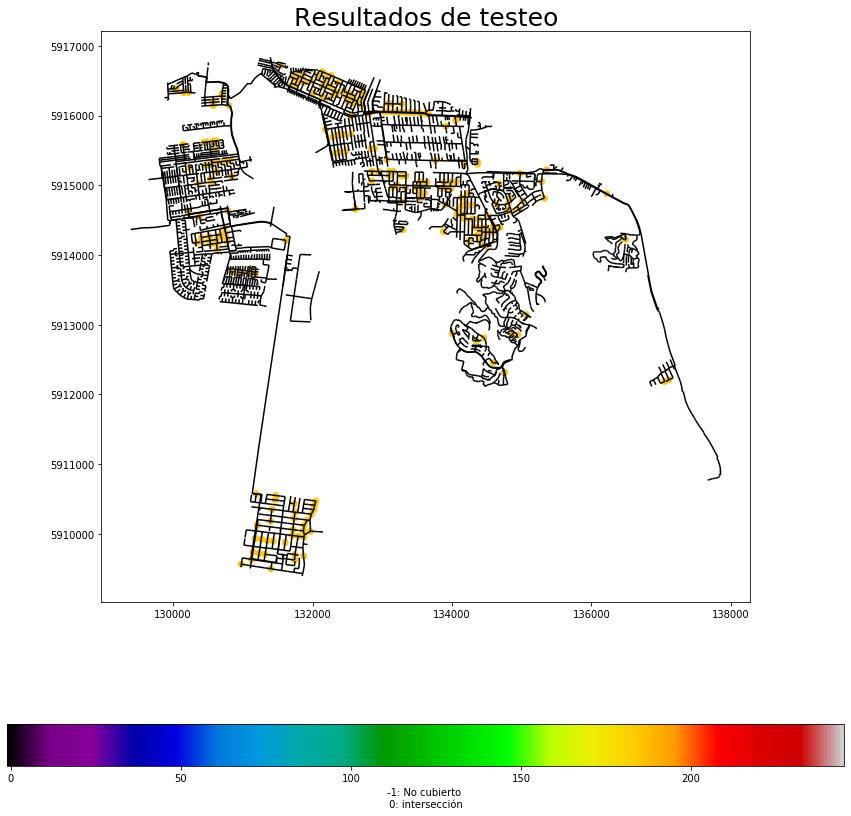

In [336]:
def plot_points(solution, G, N, geom, _id):
    geometry = geom.copy()

    geometry['color'] = -1
    # Graficamos puntos de testeo
    points = solution
    coord = points_coordinates(points, geometry, _id)
    for i in range(len(coord)):
        geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [coord[i]] + [round(len(solution) * 3 / 4)]
    
    geometry.loc[geometry.shape[0] + 500] = ['a'] + ["b"] + [3] + [1] + [None] + [len(solution)]
    
    #Graficamos
    f, ax = plt.subplots(figsize=(15, 15))
    ax.set_title("Resultados de testeo", fontsize=25)
    ax = geometry.plot(ax = ax, column = 'color',
                       figsize=(15, 15),
                       legend = True,
                       legend_kwds={'label': "-1: No cubierto \n 0: intersección ", 'orientation': "horizontal"},
                       cmap = 'nipy_spectral',)

    plt.show()
plot_points([t for t in range(N) if len(list(G.successors(t))) > 1], G, N, geometry, _id)

## Pruebas con grafos límites

Instanciamos grafo

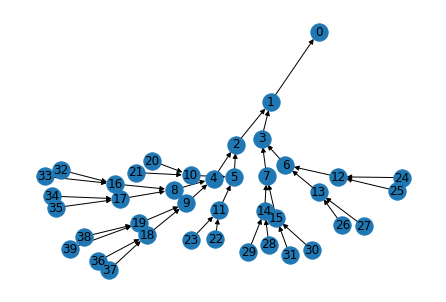

In [874]:
Test = nx.DiGraph()
Test_tree = nx.DiGraph()
n = 20
Test.add_edge(1, 0)
Test_tree.add_edge(1, 0)

for i in range(1,n):
    #Test.add_node(i);  Test.add_node(2*i); Test.add_node(2*i + 1)
    Test.add_edge(2*i, i )
    Test.add_edge(2*i + 1, i)
    
    Test_tree.add_edge(2*i, i )
    Test_tree.add_edge(2*i + 1, i)

for i in range(2,n):
    Test.add_edge(i, i -1)

nx.draw(Test_tree, with_labels = True)
#nx.draw(Test, with_labels = True)

#nx.DiGraph()

### Simulación no robusta

In [636]:
iters = []; positions = []
root = 0
M = len(Test.nodes()) 
W_ = [201] * M
V = [0] * M

low = 1; high = M
while low != high:
    mid = (low + high) // 2
    P, sP = greedyAppReduceDynamic(Test, W_, V , 3, mid, 1e8)
    if M - sP < mid:
        high = mid
    else:
        low = mid + 1
init_P, _ = greedyAppReduceDynamic(Test, W_, V, 3, low, 1e8)

for r in list(Test.nodes()):
    CV = [0 for u in range(M)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in Test.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * M

    R = M; s = 0
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(M)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 5:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(Test, W_, V, 2, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(Test, W_, V, 2, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(Test, W_, V, 2, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(Test, W_, V, 2, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        P = find_order(Test, V, P, s)
        
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(Test, V, u)[::-1])
                V = [not (v in I) for v in range(M)]
                s = u; break
            else:
                V, _ = visit(Test, V, u)
                #V = add_visit_robust(Test, V, u)
                
        size, weight = get_size_weight(Test, W_, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)
        #print(s, size)
        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))

Result 1: 6    acc: 6.0
Result 0: 6    acc: 6.0
Result 2: 5    acc: 5.666666666666667
Result 3: 5    acc: 5.5
Result 4: 4    acc: 5.2
Result 5: 4    acc: 5.0
Result 6: 4    acc: 4.857142857142857
Result 7: 4    acc: 4.75
Result 8: 4    acc: 4.666666666666667
Result 9: 4    acc: 4.6
Result 10: 4    acc: 4.545454545454546
Result 11: 4    acc: 4.5
Result 12: 5    acc: 4.538461538461538
Result 13: 5    acc: 4.571428571428571
Result 14: 4    acc: 4.533333333333333
Result 15: 4    acc: 4.5
Result 16: 4    acc: 4.470588235294118
Result 17: 4    acc: 4.444444444444445
Result 18: 4    acc: 4.421052631578948
Result 19: 4    acc: 4.4
Result 20: 5    acc: 4.428571428571429
Result 21: 5    acc: 4.454545454545454
Result 22: 5    acc: 4.478260869565218
Result 23: 4    acc: 4.458333333333333
Result 24: 4    acc: 4.44
Result 25: 4    acc: 4.423076923076923
Result 26: 6    acc: 4.481481481481482
Result 27: 6    acc: 4.535714285714286
Result 28: 4    acc: 4.517241379310345
Result 29: 4    acc: 4.5
Result

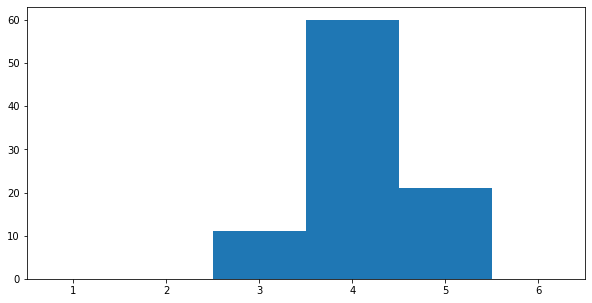

In [638]:
hist_results(iters)

### Búsqueda robusta en grafo límite

In [ ]:
def simulate_robust(G, k1, k2, root = 743):
    iters = []; positions = []
    root = 0
    Test = G
    M = len(Test.nodes()) 
    W_ = [201] * M
    V = [0] * M

    low = 1; high = M
    while low != high:
        mid = (low + high) // 2
        P, sP = greedyAppReduceDynamic(Test, W_, V , k1, mid, 1e8)
        if M - sP < mid:
            high = mid
        else:
            low = mid + 1
    init_P, _ = greedyAppReduceDynamic(Test, W_, V, k1, low, 1e8)

    for r in list(Test.nodes()):
        CV = [0 for u in range(M)]

        CV[r] = 1
        Q = deque([]); Q.append(r)
        while Q:
            u = Q.popleft()
            for v in Test.successors(u):
                if not CV[v]:
                    CV[v] = 1
                    Q.append(v)
        V = [0] * M

        R = M; s = 0
        for t in range(100):

            R = sum([1 - V[u] for u in range(M)]); P = []; sP = 0
            if t == 0:
                P = init_P
            elif R >= 5:
                low = 0; high = R
                while low != high:
                    mid = (low + high) // 2
                    P, sP = greedyAppReduceDynamic(Test, W_, V, k2, mid, 1e8)
                    if R - sP < mid:
                        high = mid
                    else:
                        low = mid + 1
                P, sP = greedyAppReduceDynamic(Test, W_, V, k2, low, 1e8)
                if low > 1:
                    P_, sP_ = greedyAppReduceDynamic(Test, W_, V, k2, low - 1, 1e8)
                    if abs(sP_ - (low - 1)) < abs(sP - low):
                        P = P_; sP = sP_
            else:
                P, sP = greedyAppReduceDynamic(Test, W_, V, k2, 1, 1e8)


            if s not in P:
                P.append(s)
            P = find_order(Test, V, P, s)

            for u in P[::-1]:
                if CV[u]:
                    I = set(get_ideal(Test, V, u)[::-1])
                    V = [not (v in I) for v in range(M)]
                    s = u; break
                else:
                    #V, _ = visit(Test, V, u)
                    V = add_visit_robust(Test, V, u)

            size, weight = get_size_weight(Test, W_, V, s)
            #size, weight = get_size_weight_robust(G, W, V, s)
            #print(s, size)
            if size == 1 or weight <= 200:
                iters.append(t + 1); positions.append(r)
                print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
                break
            if t == 99:
                iters.append(100); positions.append(r)
                print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")

    print(sum(iters) / len(iters), max(iters))
    hist_results(iters)
    return iters, list(positions)
root = 0
iters, pos = simulate_robust(Test, 3, 2, 0)

## Caracterización de nodos 'malos'

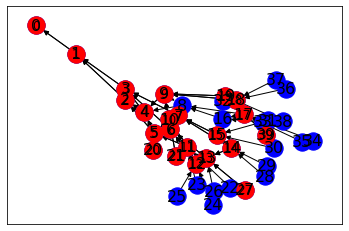

In [972]:
bad_boys = [pos[i] for i in range(len(iters)) if iters[i] >= 5]
pos_ = nx.spring_layout(Test, scale=2)
nx.draw_networkx(Test, pos=pos_, font_size=16, node_color='blue')
nx.draw_networkx(Test.subgraph(bad_boys), pos=pos_, node_color = 'red')

In [973]:
P = 0; S = 0
for node in bad_boys:
    p = len(list(Test.predecessors(node)))
    s = len(list(Test.successors(node)))
    P += p; S += s
print(f'Nodos malos. Antecesores promedio: {P/len(bad_boys)}, Sucesores: {S/len(bad_boys)}')
P_ = [len(list(Test.predecessors(node))) for node in list(Test.nodes()) if node not in bad_boys]
S_ = [len(list(Test.successors(node))) for node in list(Test.nodes()) if node not in bad_boys]
print(f'Nodos buenos. Antecesores promedio:{sum(P_)/len(P_)}, Sucesores: {sum(S_)/len(S_)}')

Nodos malos. Antecesores promedio: 2.272727272727273, Sucesores: 1.6363636363636365
Nodos buenos. Antecesores promedio:0.3333333333333333, Sucesores: 1.1111111111111112


### Arbol

Result 1: 5    acc: 5.0
Result 0: 5    acc: 5.0
Result 2: 4    acc: 4.666666666666667
Result 3: 5    acc: 4.75
Result 4: 5    acc: 4.8
Result 5: 4    acc: 4.666666666666667
Result 6: 4    acc: 4.571428571428571
Result 7: 5    acc: 4.625
Result 8: 4    acc: 4.555555555555555
Result 9: 5    acc: 4.6
Result 10: 3    acc: 4.454545454545454
Result 11: 4    acc: 4.416666666666667
Result 12: 3    acc: 4.3076923076923075
Result 13: 4    acc: 4.285714285714286
Result 14: 4    acc: 4.266666666666667
Result 15: 5    acc: 4.3125
Result 16: 3    acc: 4.235294117647059
Result 17: 4    acc: 4.222222222222222
Result 18: 4    acc: 4.2105263157894735
Result 19: 5    acc: 4.25
Result 20: 2    acc: 4.142857142857143
Result 21: 3    acc: 4.090909090909091
Result 22: 3    acc: 4.043478260869565
Result 23: 4    acc: 4.041666666666667
Result 24: 3    acc: 4.0
Result 25: 3    acc: 3.9615384615384617
Result 26: 3    acc: 3.925925925925926
Result 27: 3    acc: 3.892857142857143
Result 28: 3    acc: 3.86206896551

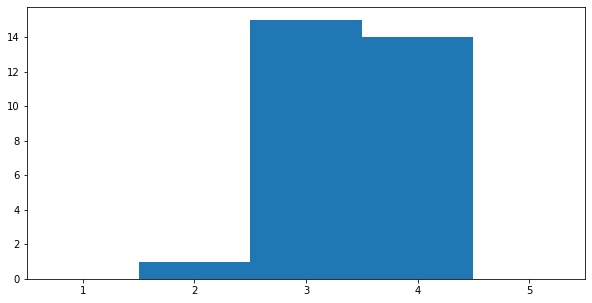

([5,
  5,
  4,
  5,
  5,
  4,
  4,
  5,
  4,
  5,
  3,
  4,
  3,
  4,
  4,
  5,
  3,
  4,
  4,
  5,
  2,
  3,
  3,
  4,
  3,
  3,
  3,
  3,
  3,
  4,
  4,
  5,
  3,
  3,
  3,
  3,
  3,
  4,
  4,
  5],
 [1,
  0,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39])

In [974]:
simulate_robust(Test_tree, 3, 2, 0)

In [38]:
def find_order(G, V, sample, s):
    ans = []; Q = deque([]); Q.append(s)
    while Q:
        u = Q.popleft()
        if u in sample:
            ans.append(u)
            sample.remove(u)
        for v in G.predecessors(u):
            if not V[v]:
                Q.append(v)
    return ans

In [592]:
def plot_from_ideals(ideals, G, N, geom, _id):
    geometry = geom.copy()
    visited = list(ideals.values())
    bif_ = [t for t in range(N) if len(list(G.successors(t))) > 1]

    # Marcamos los elementos visitados en geometry
    geometry['color'] = -1
    for i in range(len(visited)):
        for n in visited[i]:
            n = _id[n]
            geometry.loc[geometry['self'] ==  str(n) , 'color'] = i + 1  
            for ideal in visited:
                if n in ideal and ideal != visited[i]:
                    # Identificamos intersecciones y las ploteamos de diferente color
                    geometry.loc[geometry['self'] ==  str(n) , 'color'] = 0 
                    break

    # Graficamos puntos de testeo
    points = list(ideals.keys())
    coord = points_coordinates(points, geometry, _id)
    for i in range(len(coord)):
        geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [coord[i]] + [round(len(points) * 3 / 4)]
    
    bif = points_coordinates(bif_, geometry, _id)
    for i in range(len(bif)):
        geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [bif[i]] + [round(len(points) * 1 / 4)]
    
    geometry.loc[geometry.shape[0] + 500] = ['a'] + ["b"] + [3] + [1] + [None] + [len(points) + 1]
    
    #Graficamos
    f, ax = plt.subplots(figsize=(15, 15))
    ax.set_title("Resultados de testeo", fontsize=25)
    ax = geometry.plot(ax = ax, column = 'color',
                       figsize=(15, 15),
                       legend = True,
                       legend_kwds={'label': "-1: No cubierto \n 0: intersección ", 'orientation': "horizontal"},
                       cmap = 'nipy_spectral',)

    plt.show()

## Visualización de simulación robusta

In [577]:
from ipynb.fs.full.Visualizaciones import *

In [362]:
path = 'data/graph_geom_corrected_cycles.csv'
csv_grafo = pd.read_csv(path, sep=';')


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])

In [951]:
low = 0; high = N
while low != high:
    mid = (low + high) // 2
    P, sP = greedyAppReduceDynamic(G, W, [0] * N, 8, mid, 1e8)
    if N - sP < mid:
        high = mid
    else:
        low = mid + 1
init_P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

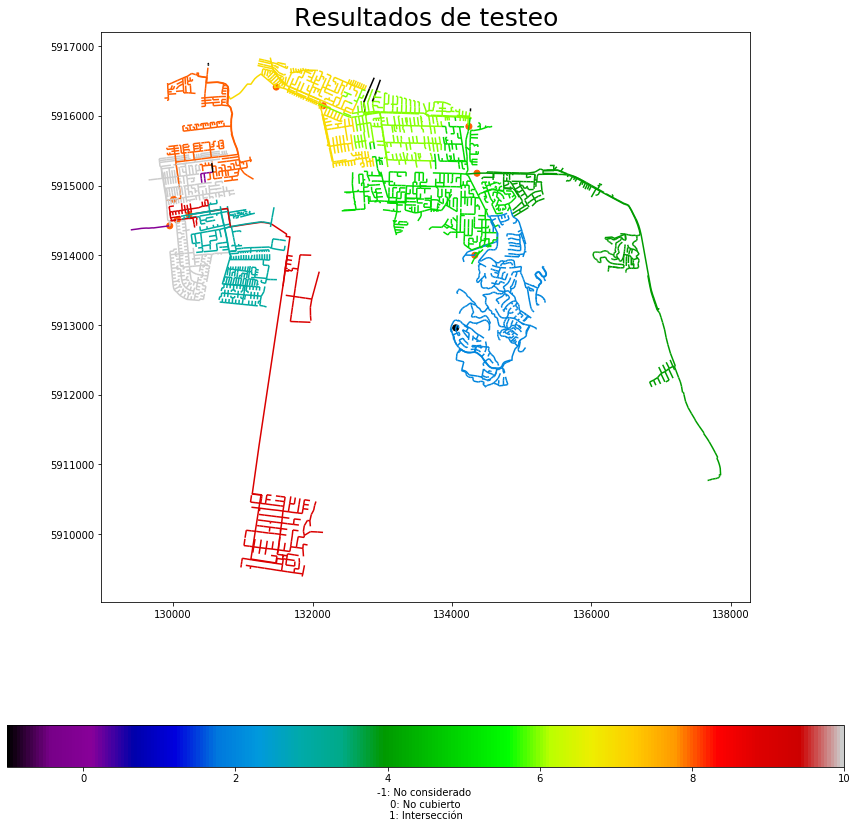

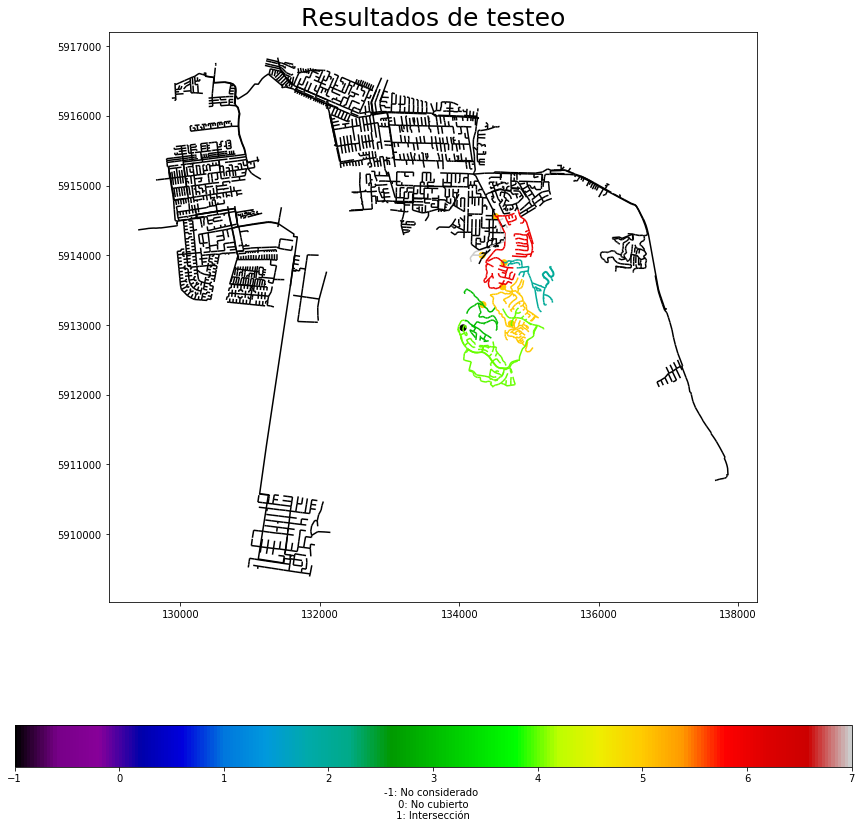

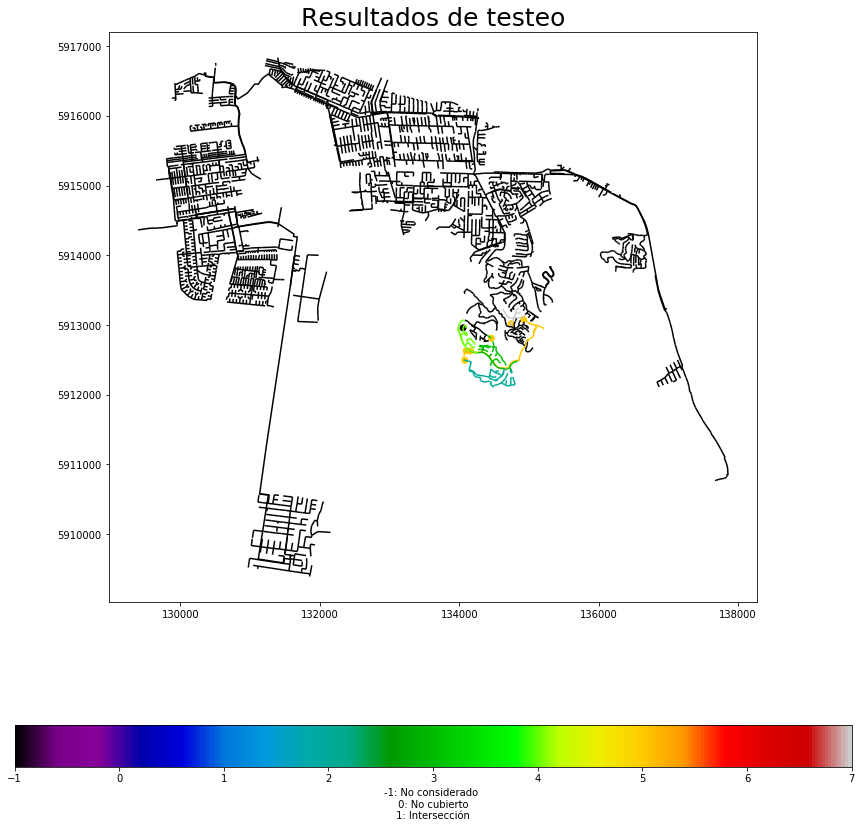

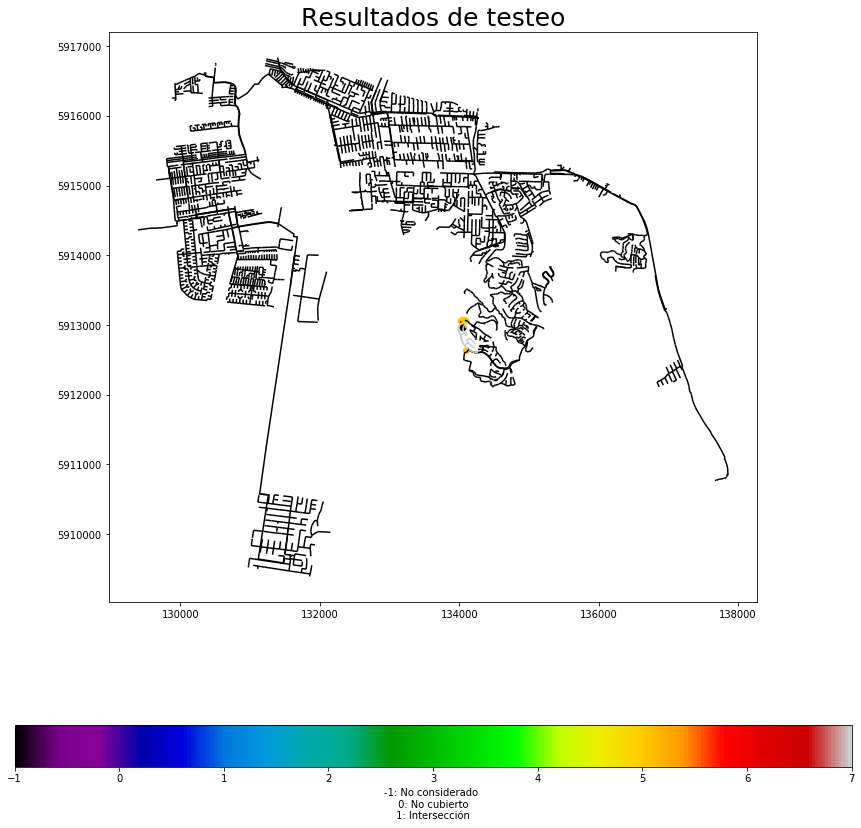

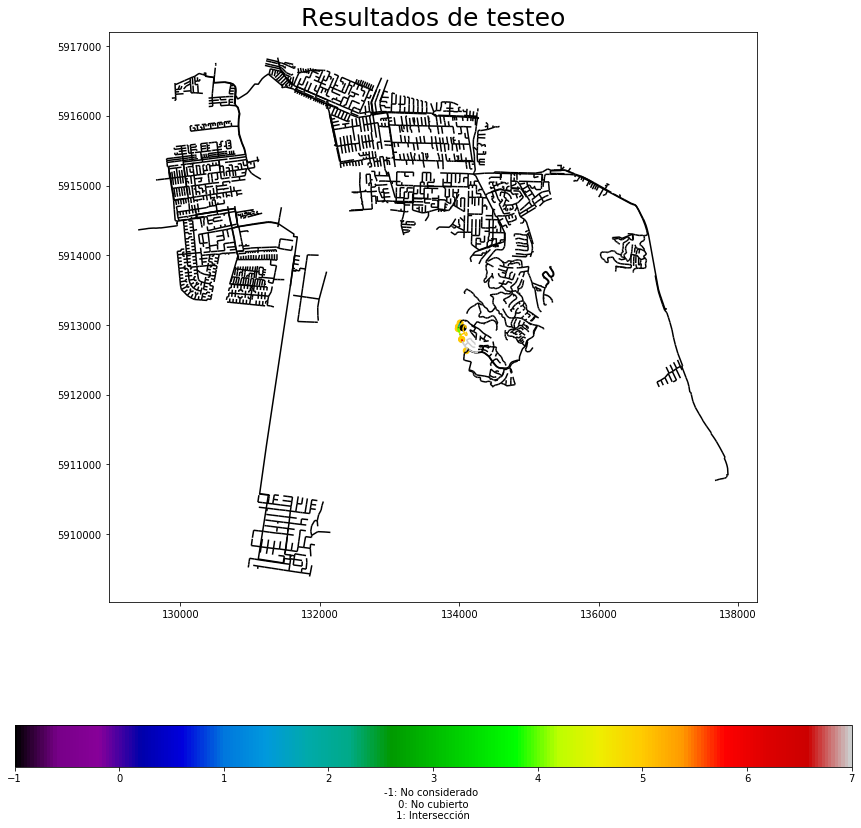

Result 887: 5    acc: 5.0


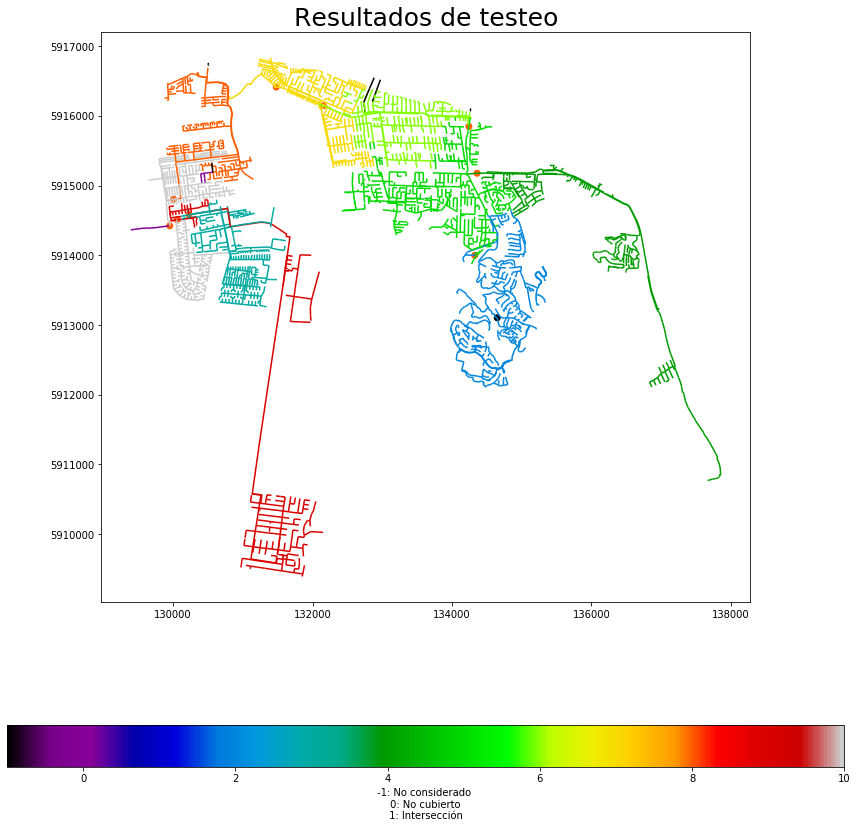

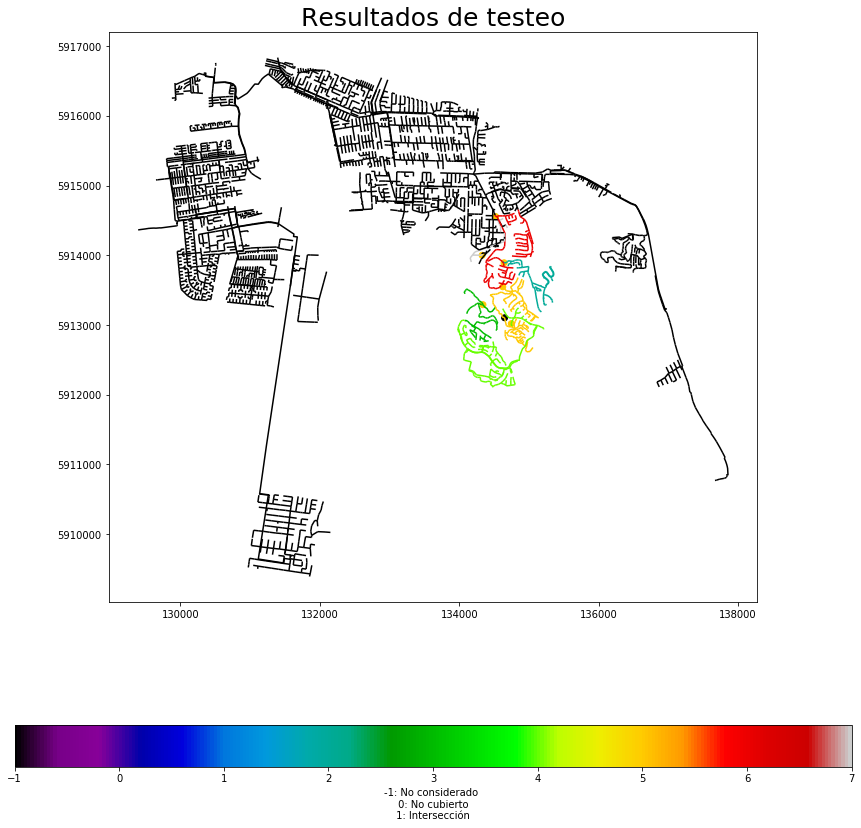

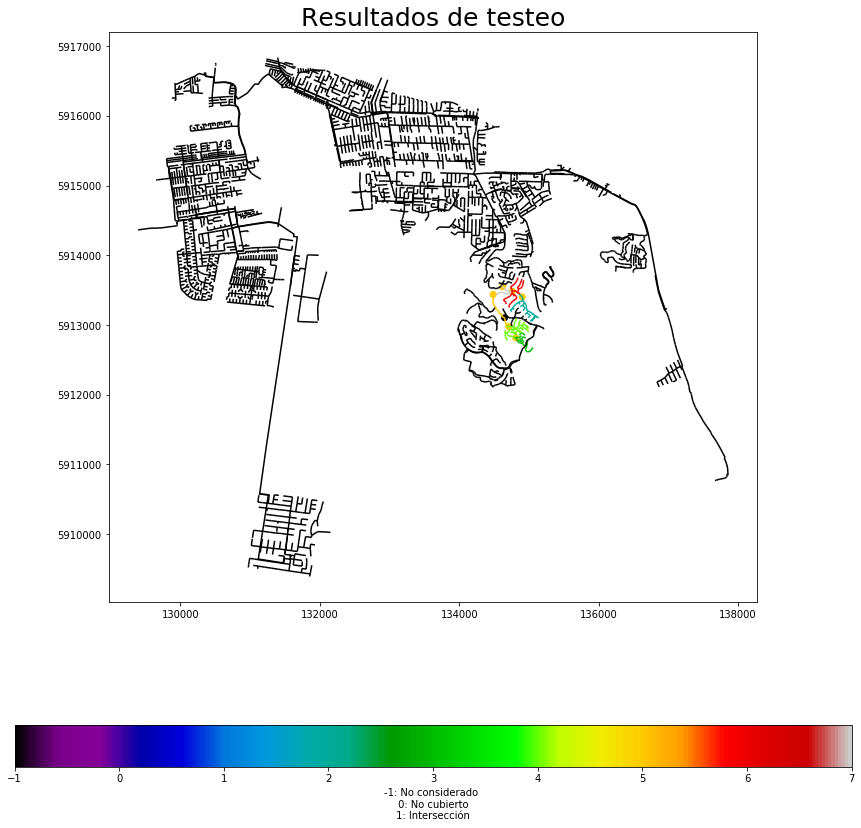

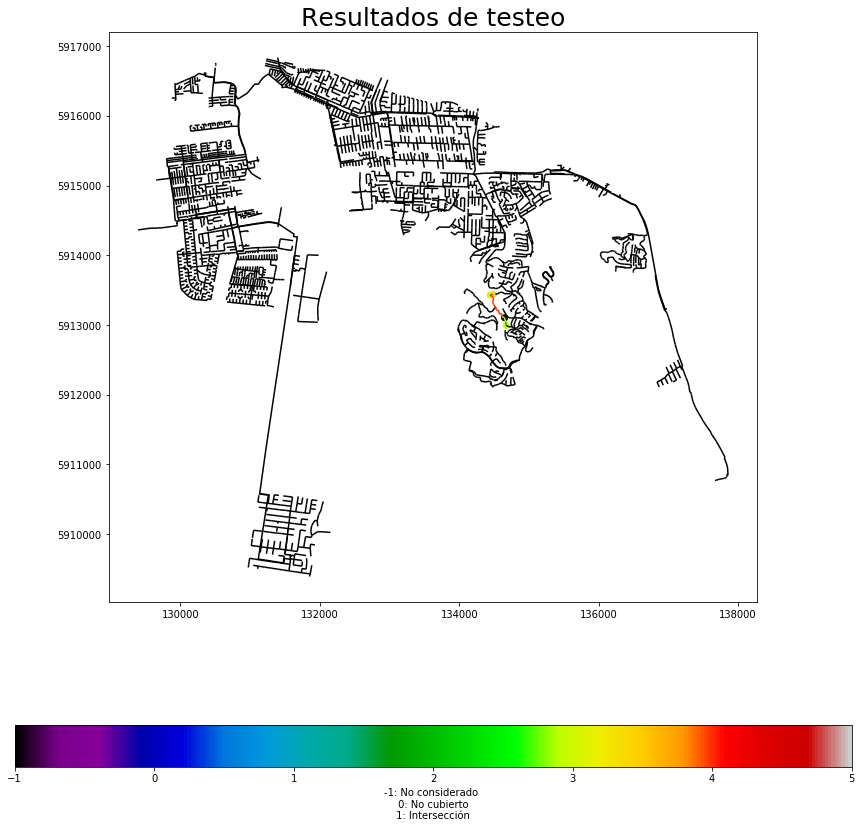

Result 3816: 4    acc: 4.5


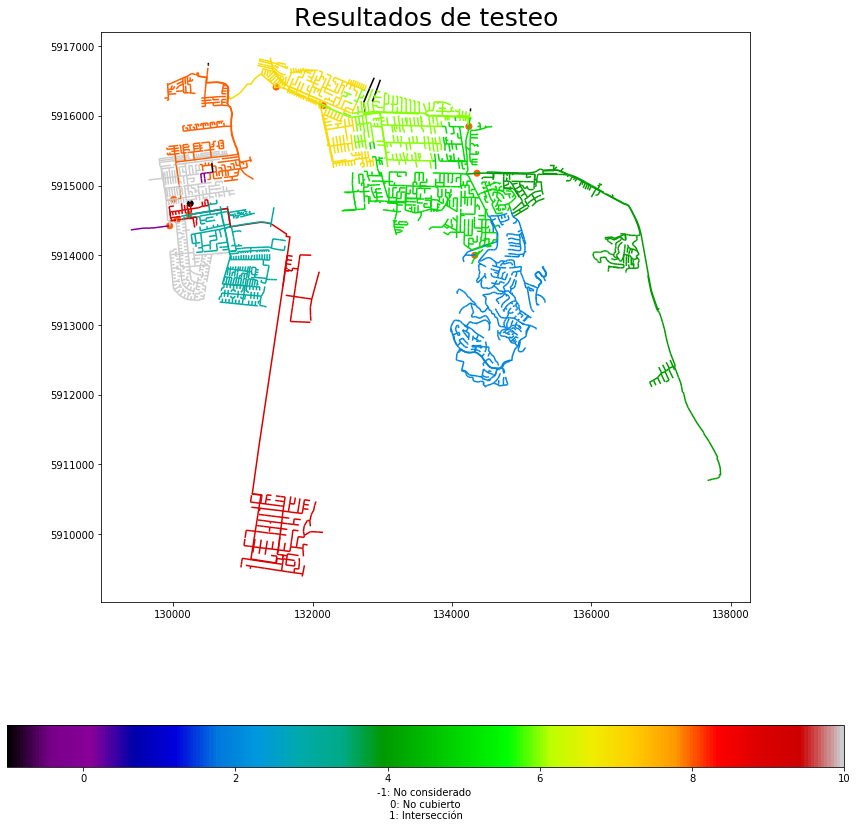

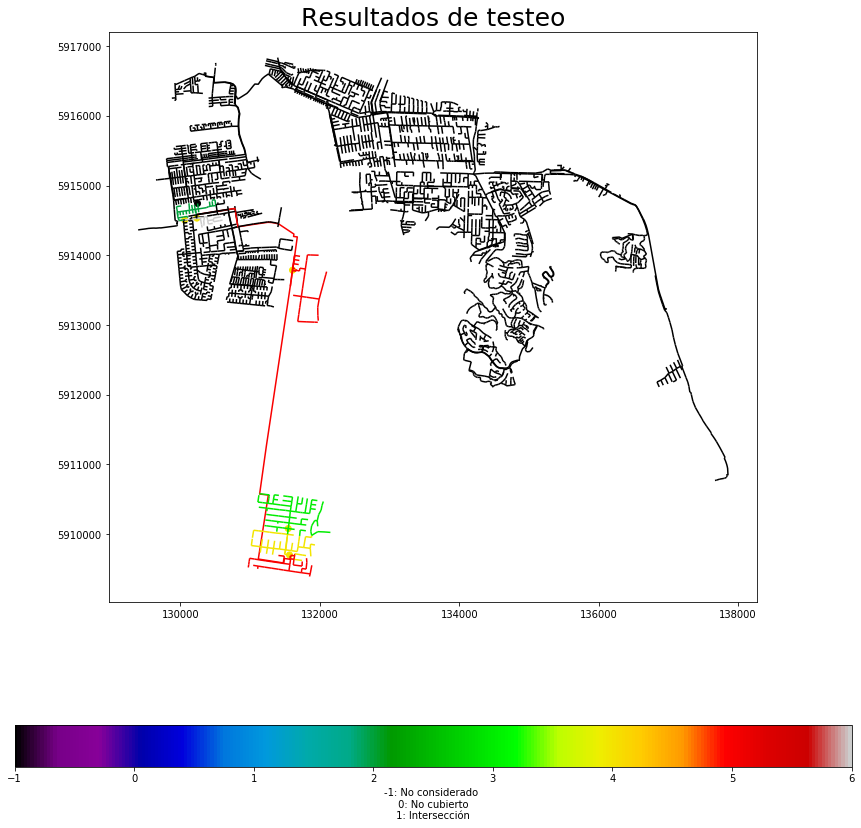

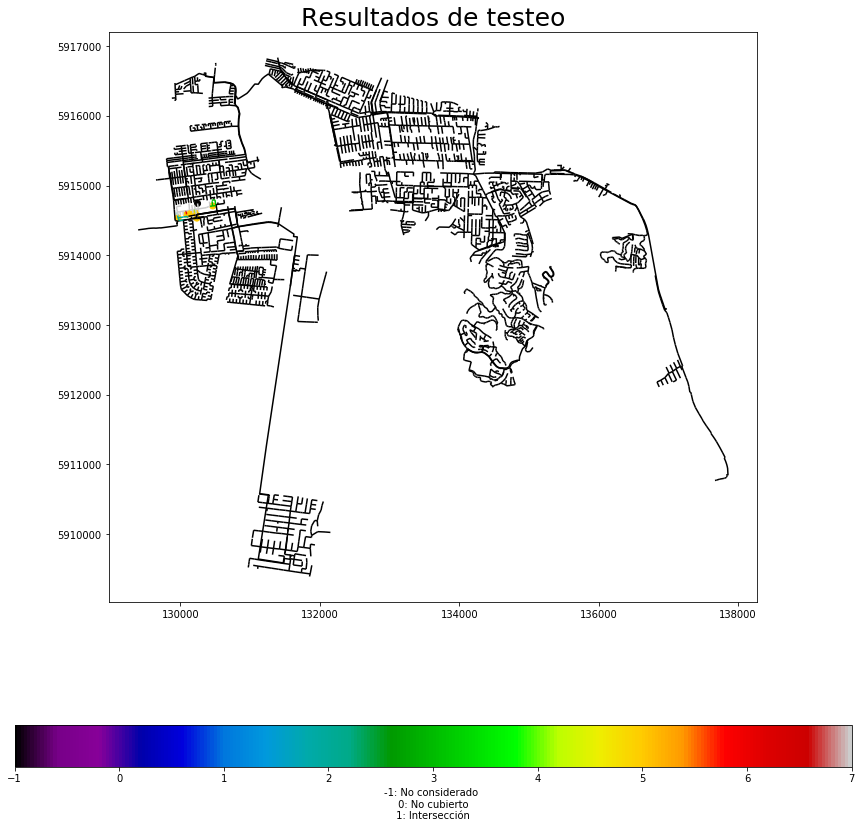

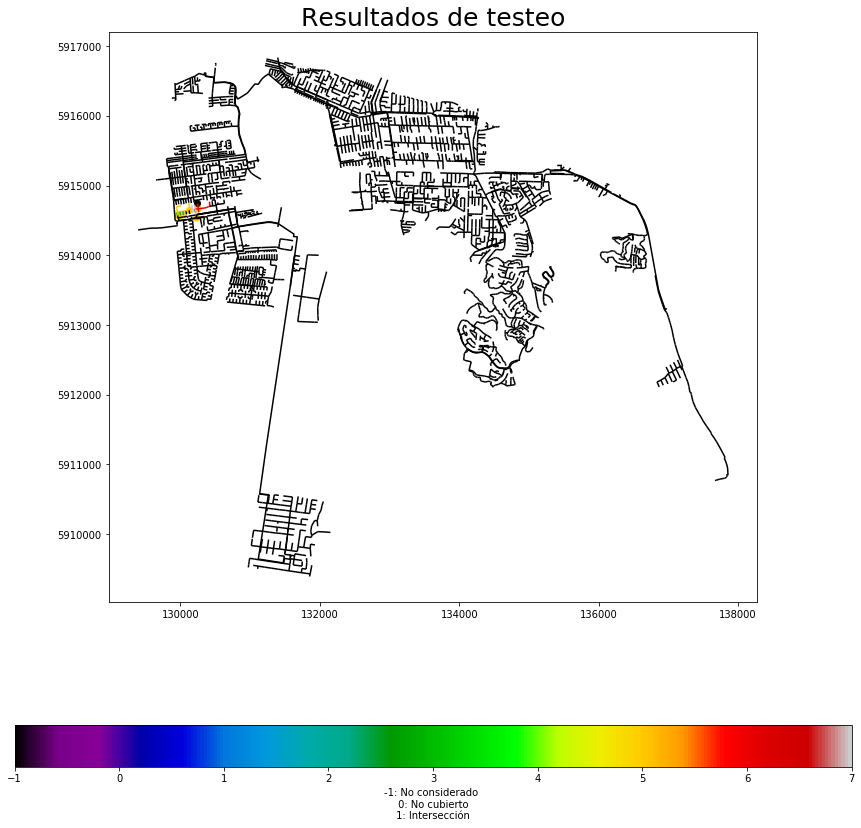

Result 720: 4    acc: 4.333333333333333
4.333333333333333 5


In [952]:
#plot_from_ideals(ideals, G, N, geom, _id)
solution = [1,2,3]
import random

root = 743
iters = []; positions = []
S = random.sample(range(N), 3)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic_robust(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic_robust(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic_robust(G, W, V, 5, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        
        plot_sample_robust(G, V.copy(), P, r, geometry, _id)
        P = find_order(G, V, P, s)        
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                #plot_from_ideals({u:I}, G, N, geometry, _id)
                V = [not (v in I) for v in range(N)]
                s = u; break
            else:
                V = add_visit_robust(G, V, u)

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))

### Visualización de partición rubusta inducida

In [761]:
low = 372
K = 8
P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

In [825]:
def plot_sample_robust(G, V, sample, r, geom, _id):
    geometry = geom.copy(); N = len(V)
    #s = find_order(G, [0] * N, sample, 743); sample = list(set(s))[::-1]

    
    # Expandimos brote de Covid
    CV = [0 for u in range(N)]
    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    
    I = []; C = [-1 * V[u] for u in range(N)]
    for u in sample:
        I.append(get_ideal(G, V, u))
        V, _ = visit(G, V, u)
    
    for i in range(len(I)):
        for u in I[i]:
            if C[u] == 0:
                C[u] = i + 2
            elif C[u] != 1:
                C[u] = 1
                
    # Marcamos los elementos visitados en geometry
    geometry['color'] = -1
    for u in range(N):
        if C[u] != -1:
            geometry.loc[geometry['self'] == str(_id[u]) , 'color'] = C[u]
            
    sample = find_order(G, [0] * N, sample, 743)
    sample = sample[::-1]
    for u in range(len(sample)):
        s = sample[u]
        if CV[s]:
            ideal = get_ideal(G, V.copy(), s)
            visited = []
            for i in sample[:u]:
                V_ =  add_visit_robust(G, V.copy(), i)
                V_ = [i for i in range(N) if V_[i]]
                visited.append(V_)   
            visited = list(itertools.chain.from_iterable( visited ))
            new_ideal = list(set(ideal) - set(visited))
            #print(len(new_ideal), visited)
            for node in new_ideal:
                geometry.loc[geometry['self'] == str(_id[node]) , 'color'] = round(len(sample)) + 1
            break
            
    # Graficamos puntos de testeo
    coord = points_coordinates(sample, geometry, _id)
    for i in range(len(coord)):
        geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [coord[i]] + [round(len(sample) * 6 / 7)]
    
    # Marcamos punto infectado
    infected = points_coordinates([r], geometry, _id)
    geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [infected[0]] + [-1]
    
          
    # Graficamos
    f, ax = plt.subplots(figsize=(15, 15))
    ax.set_title("Resultados de testeo", fontsize=25)
    ax = geometry.plot(ax = ax, column = 'color',
                       figsize=(15, 15),
                       legend = True,
                       legend_kwds={'label': "-1: No considerado \n 0: No cubierto \n 1: Intersección ", 'orientation': "horizontal"},
                       cmap = 'nipy_spectral',)
    plt.show() 

In [253]:
def plot_sample_no_intersections_robust(G, V, sample, geom, _id, robust_root):
    
    geometry = geom.copy(); N = len(V)
    
    I = []; C = [-1 * V[u] for u in range(N)]
    for u in sample:
        if u == robust_root:
            robust_ideal = get_ideal_robust(G, V, robust_root)
            #print(robust_ideal)
        I.append(get_ideal(G, V, u))
        V, _ = visit(G, V, u)
    
    for i in range(len(I)):
        for u in I[i]:
            if C[u] == 0:
                C[u] = i + 1
                
#     newC = list(range(1, len(sample) + 1))
#     random.shuffle(newC)
#     for u in range(N):
#         C[u] = newC[C[u] - 1]

    # Marcamos los elementos visitados en geometry
    geometry['color'] = -1
    for u in range(N):
        if C[u] != -1:
            geometry.loc[geometry['self'] == str(_id[u]) , 'color'] = C[u]
            
    # Graficamos ideal robusto
    for u in robust_ideal:
        geometry.loc[geometry['self'] == str(_id[u]) , 'color'] = len(sample) + 2
            
    # Graficamos puntos de testeo
    coord = points_coordinates(sample, geometry, _id)
    for i in range(len(coord)):
        geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [coord[i]] + [len(sample)]
        
    # Marcamos la raíz del ideal robusto
    highlight = points_coordinates([robust_root], geometry, _id)
    geometry.loc[geometry.shape[0] + i] = ['a'] + ["b"] + [3] + [1] + [highlight[0]] + [-1]
          
    # Graficamos
    f, ax = plt.subplots(figsize=(15, 15))
    ax.set_title("Resultados de testeo", fontsize=25)
    ax = geometry.plot(ax = ax, column = 'color',
                       figsize=(15, 15),
                       legend = True,
                       legend_kwds={'label': "-1: No considerado \n 0: No cubierto ", 'orientation': "horizontal"},
                       cmap = 'nipy_spectral',)

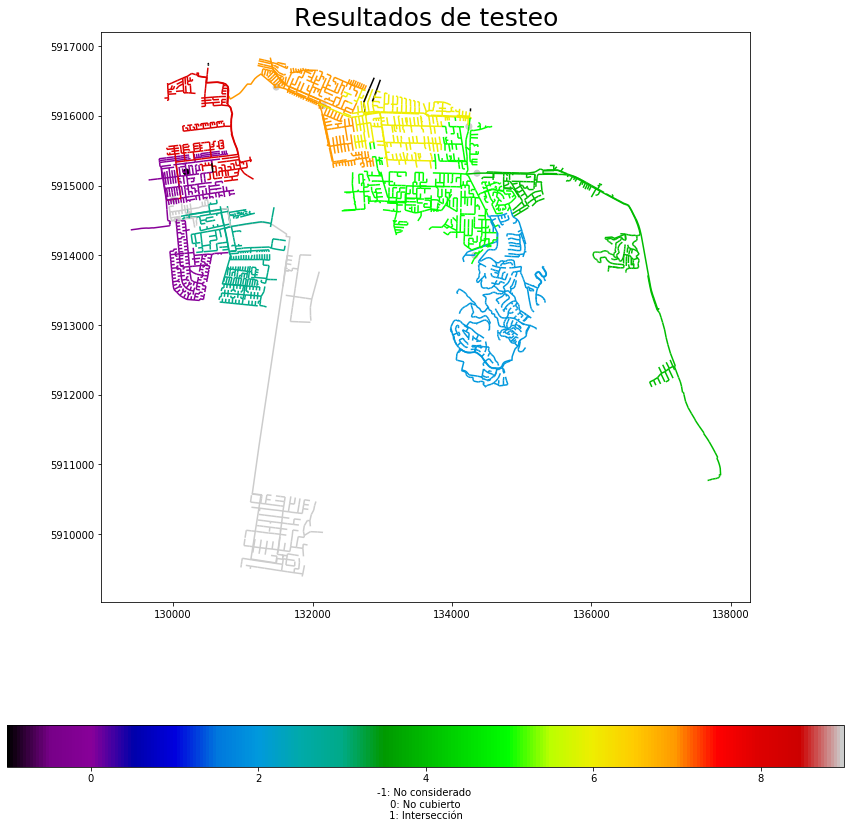

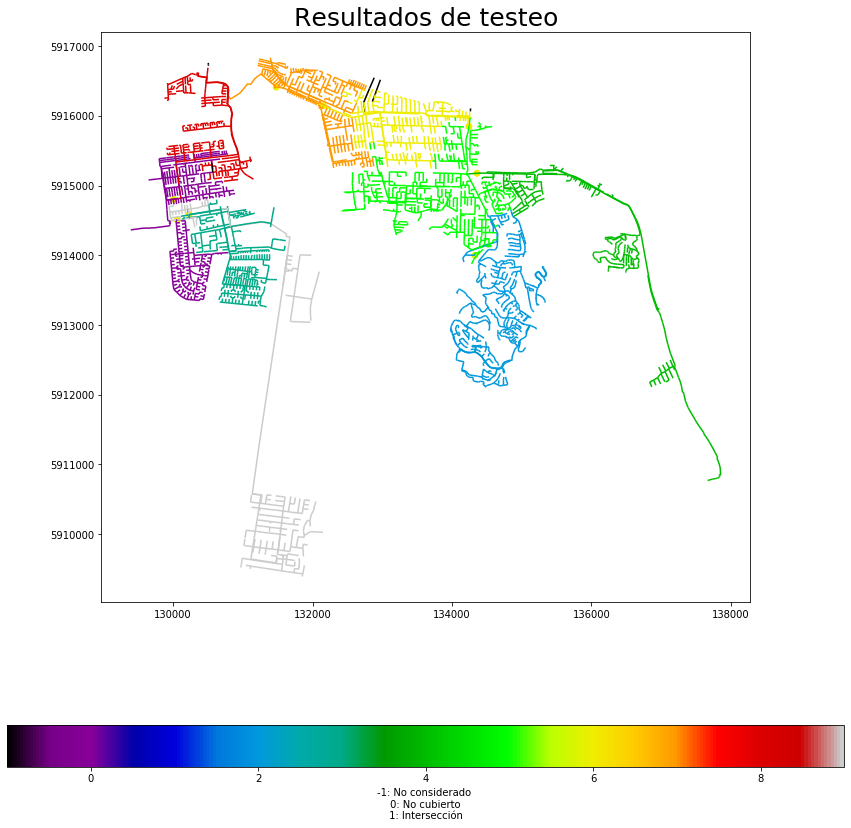

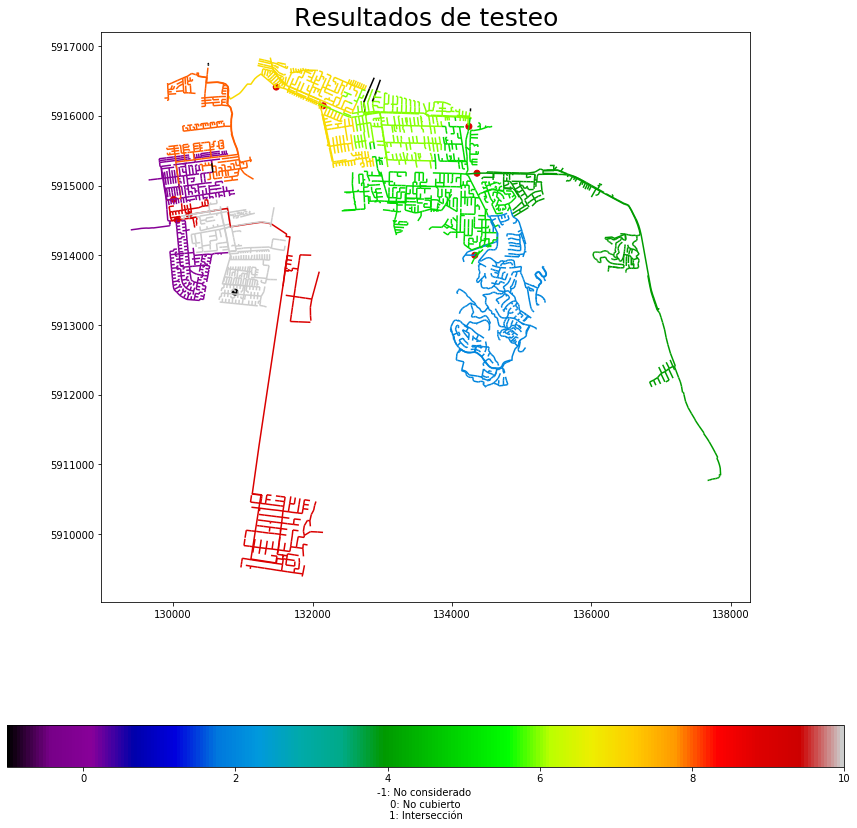

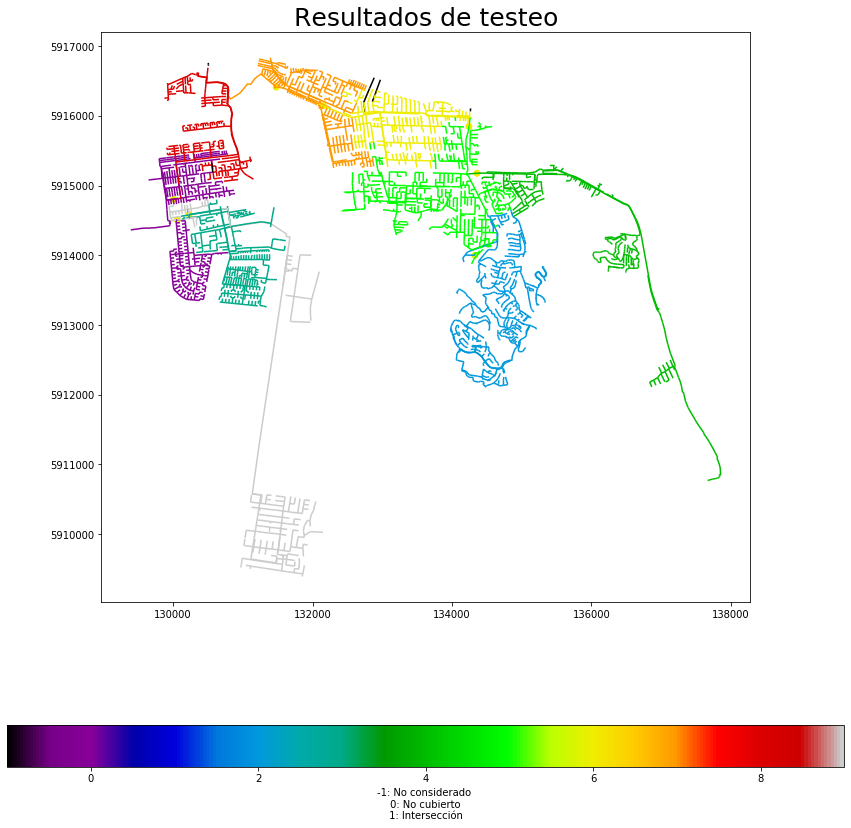

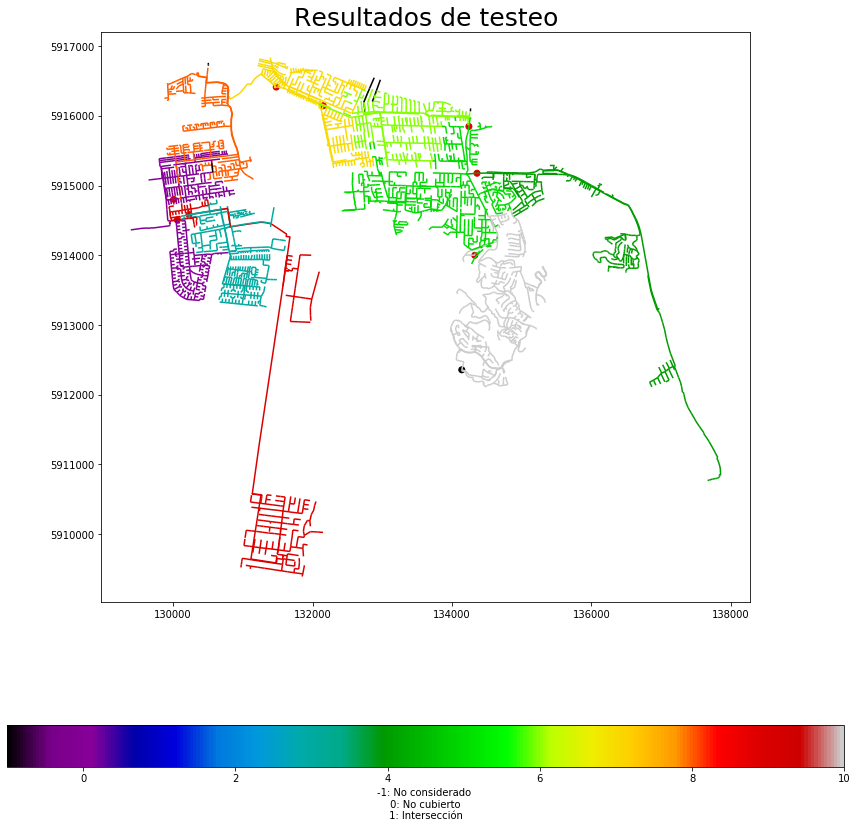

...

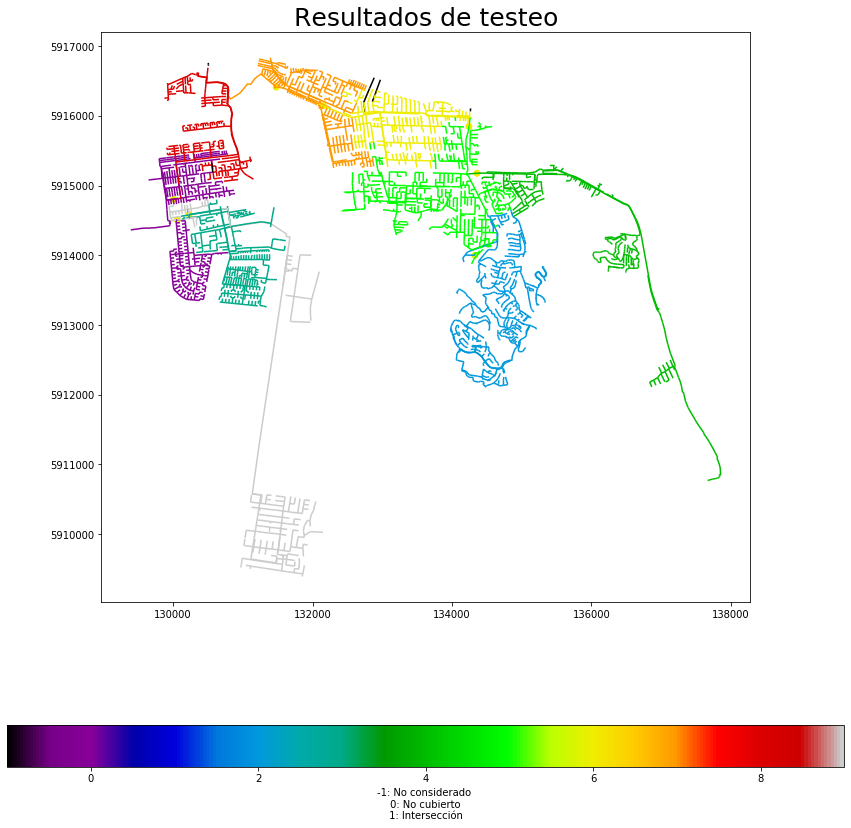

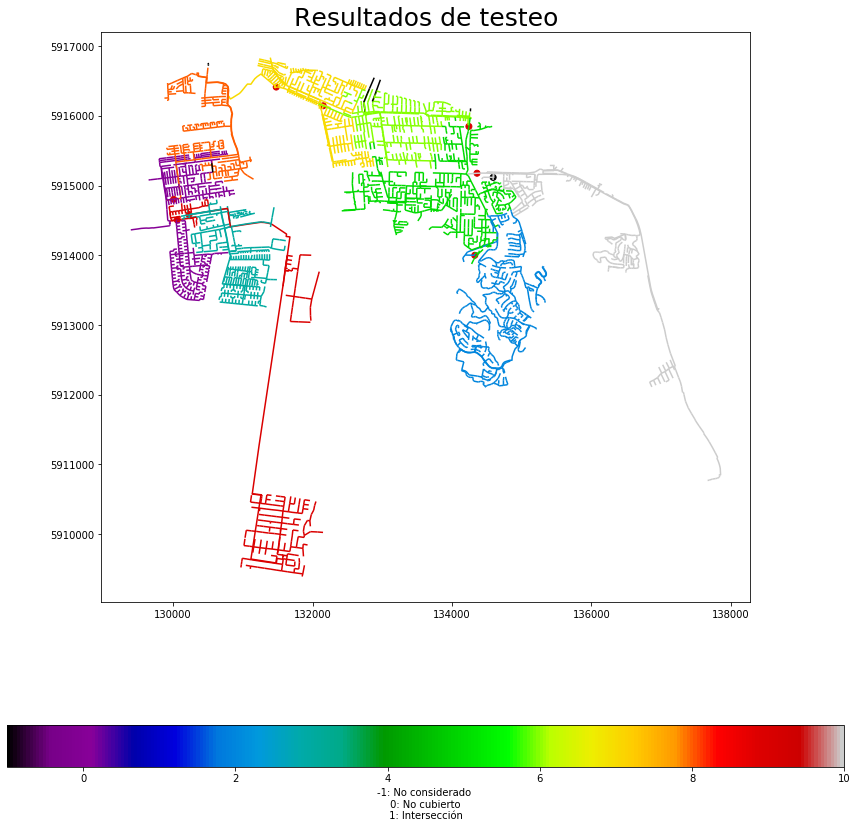

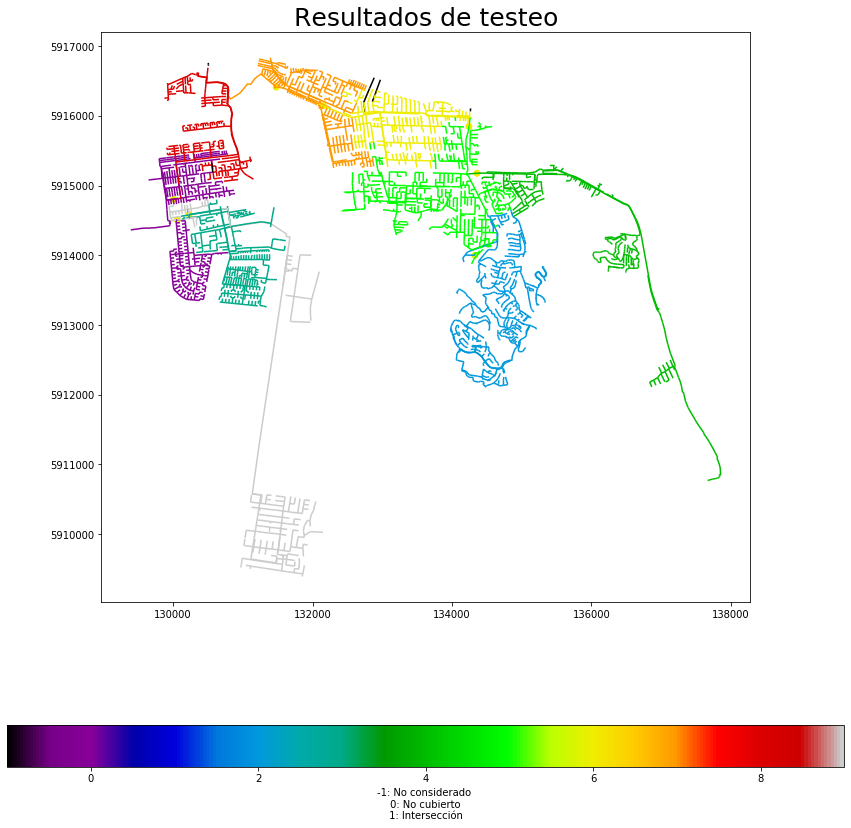

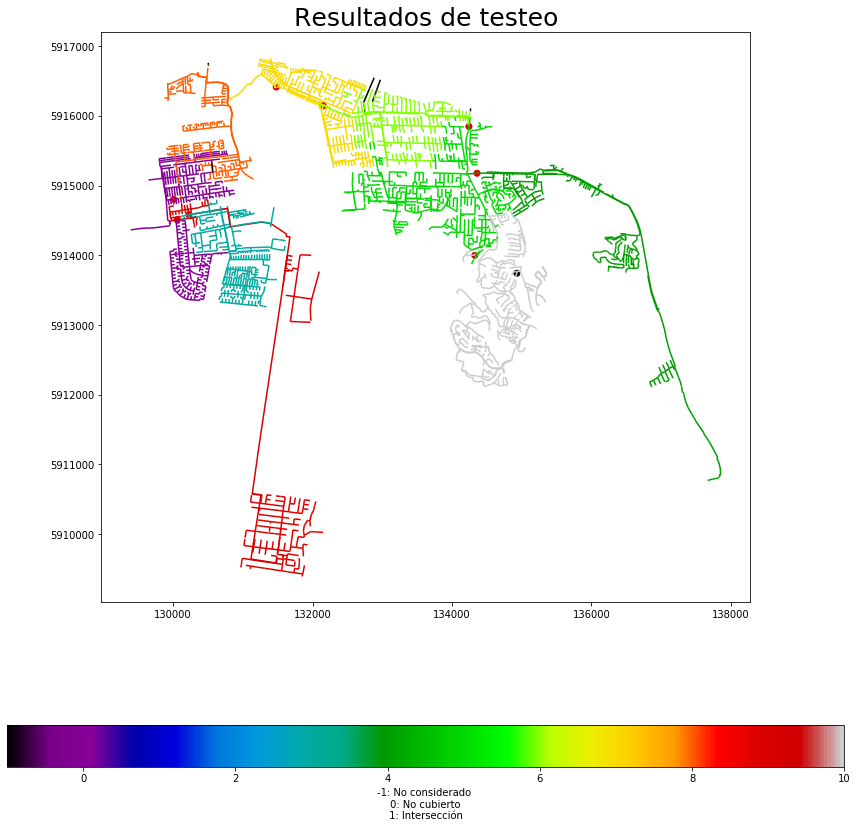

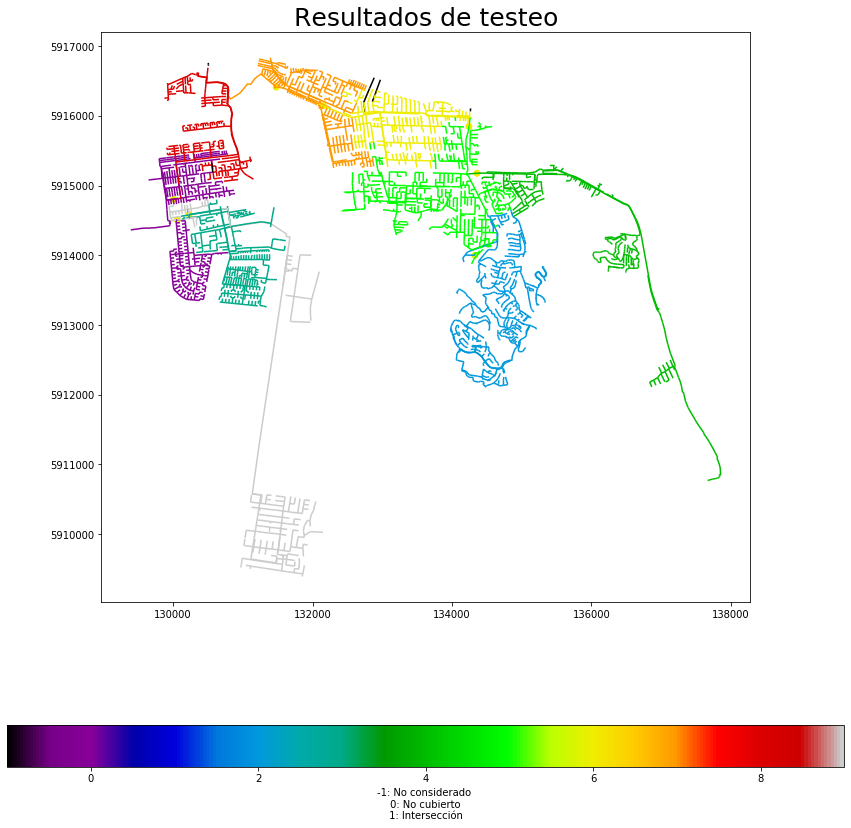

In [821]:
# Instanciamos el nodo infectado y simulamos el brote en la red
r = 250
root = 743
CV = [0 for u in range(N)]
CV[r] = 1
Q = deque([]); Q.append(r)
while Q:
    u = Q.popleft()
    for v in G.successors(u):
        if not CV[v]:
            CV[v] = 1
            Q.append(v)

# Graficamos
for r in range(1,4000, 200):
    plot_sample_robust(G, [0] * N, P, r, geometry, _id)
    plot_sample_no_intersections(G, [0] * N, P, geometry, _id)
# plot_sample_robust(G, [0] * N, P, r, geometry, _id)
# plot_sample_no_intersections(G, [0] * N, P, geometry, _id)

In [957]:
#greedyAppReduceDynamic_robust(G, W, [0] * N, 8, 372, 1e8)
greedyAppReduceDynamic(G, W, [0] * N, 8, 372, 1e8)

([3368, 1432, 3308, 1818, 1904, 2153, 2147, 744], 4584)

### Visualización de ideales robustos vs ideales cuando las diferencias sean muy altas

Result 4284: 8    acc: 8.0
Result 4533: 5    acc: 6.5
Result 3625: 7    acc: 6.666666666666667
Result 2417: 6    acc: 6.5
Result 4408: 6    acc: 6.4
Result 2613: 6    acc: 6.333333333333333
Result 1719: 6    acc: 6.285714285714286
Result 3649: 6    acc: 6.25
Result 697: 5    acc: 6.111111111111111
Result 1731: 6    acc: 6.1
6.1 8


/Users/jose/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:155: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


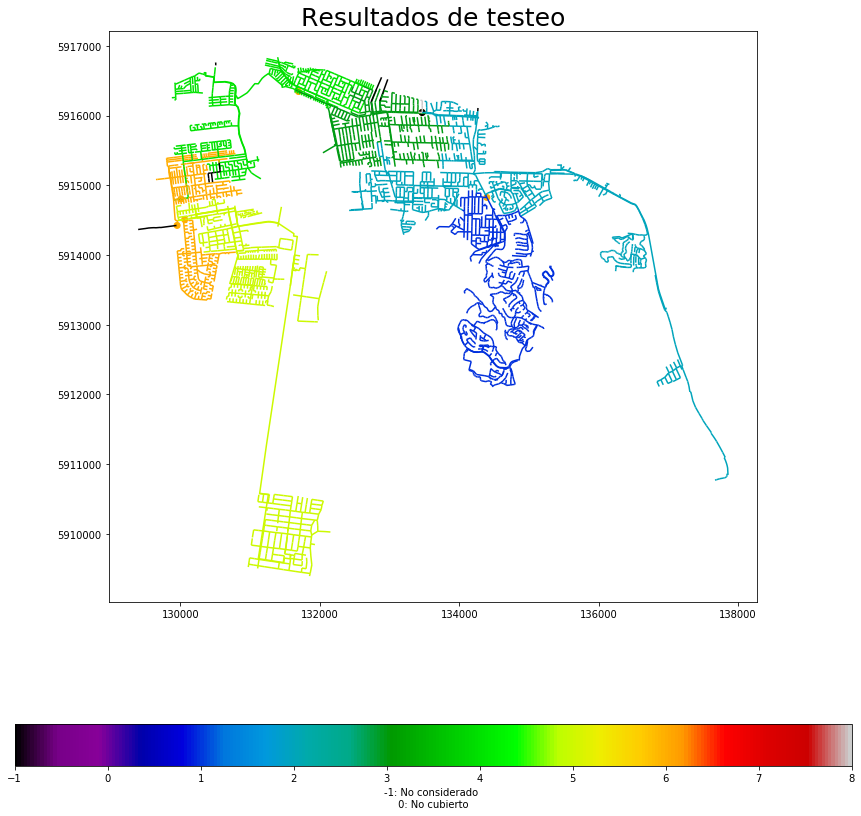

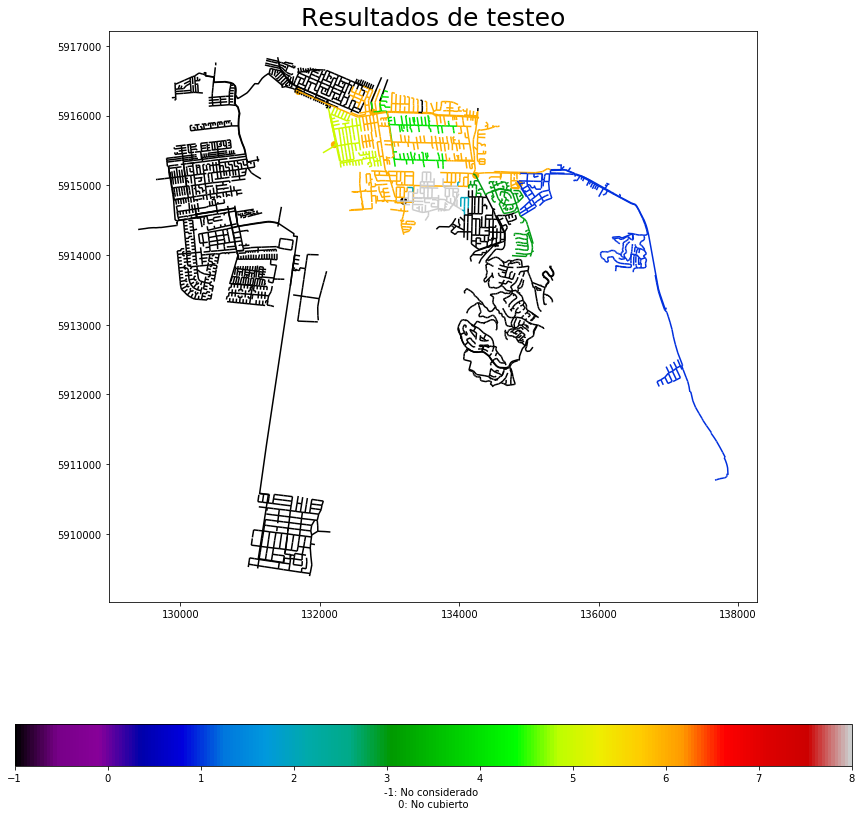

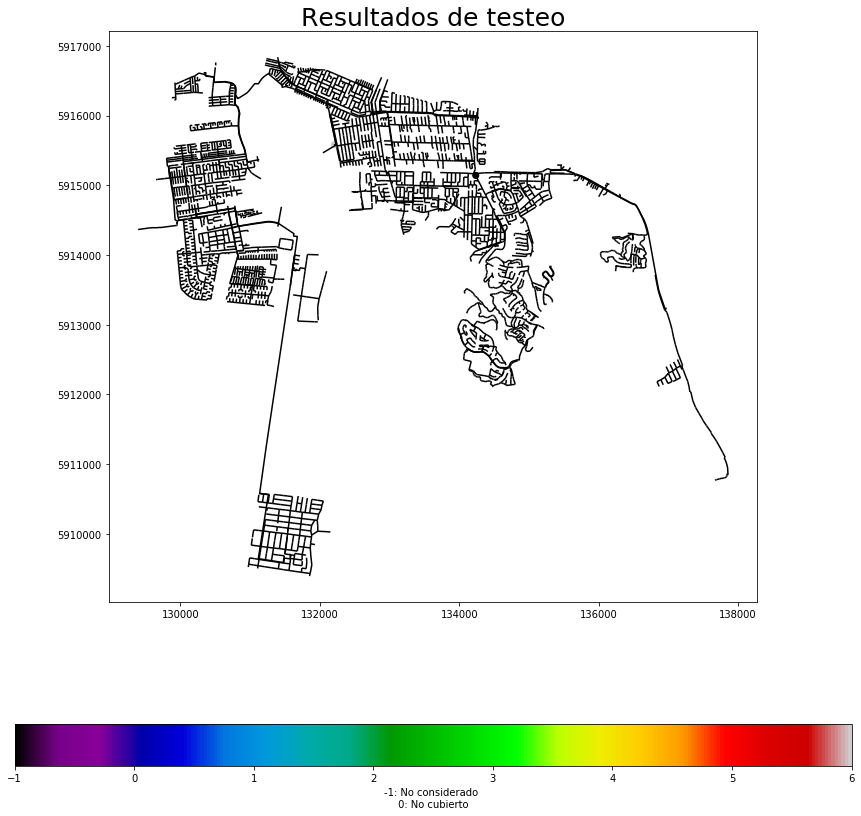

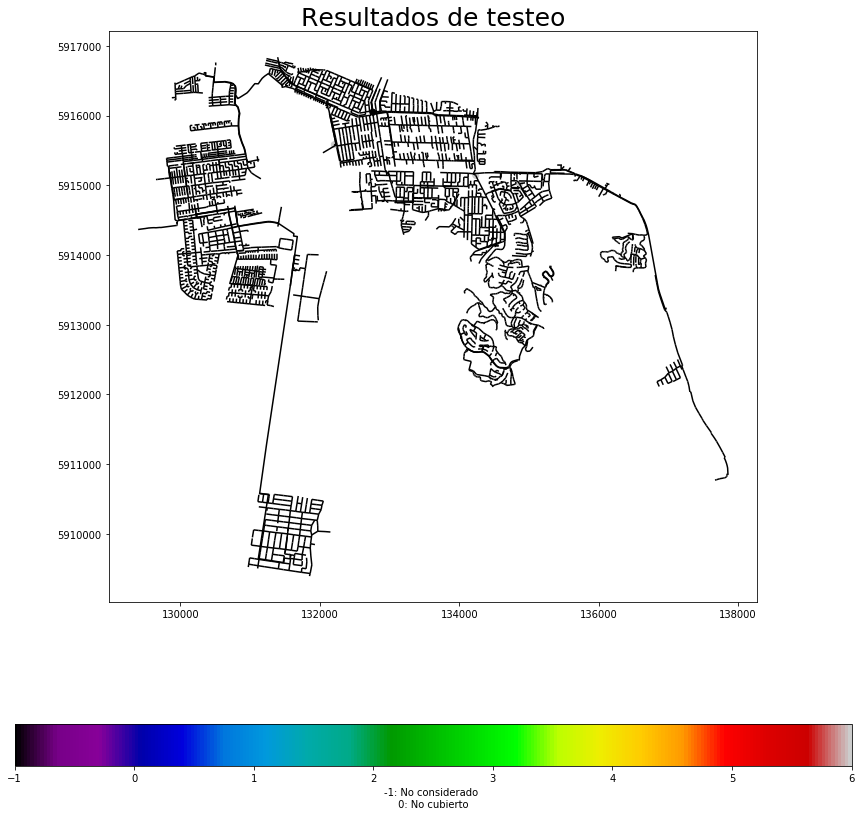

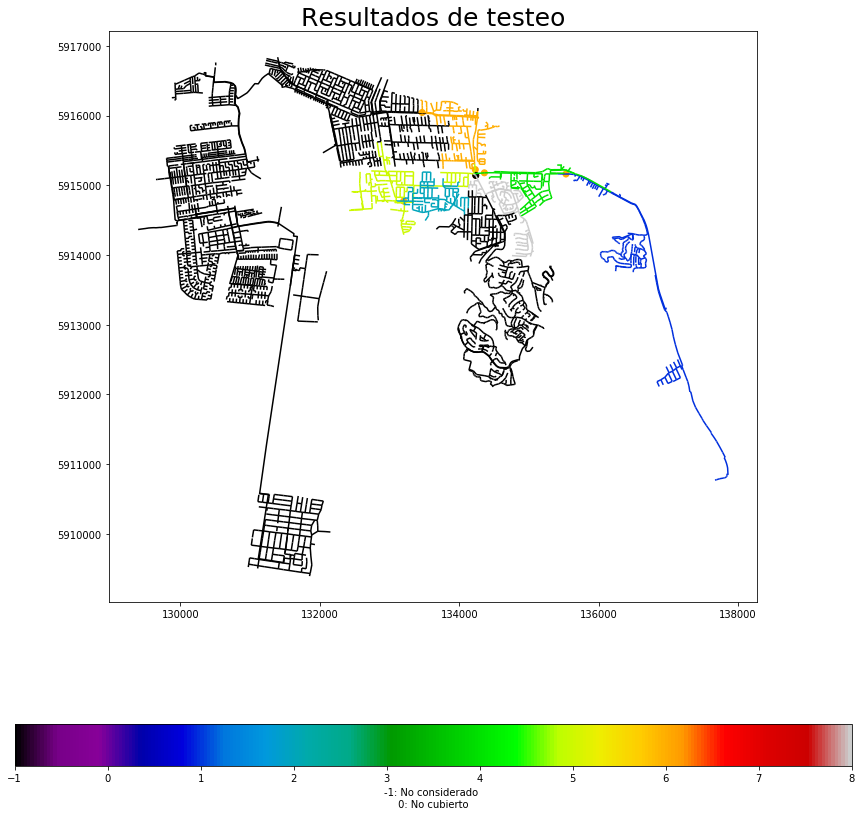

...

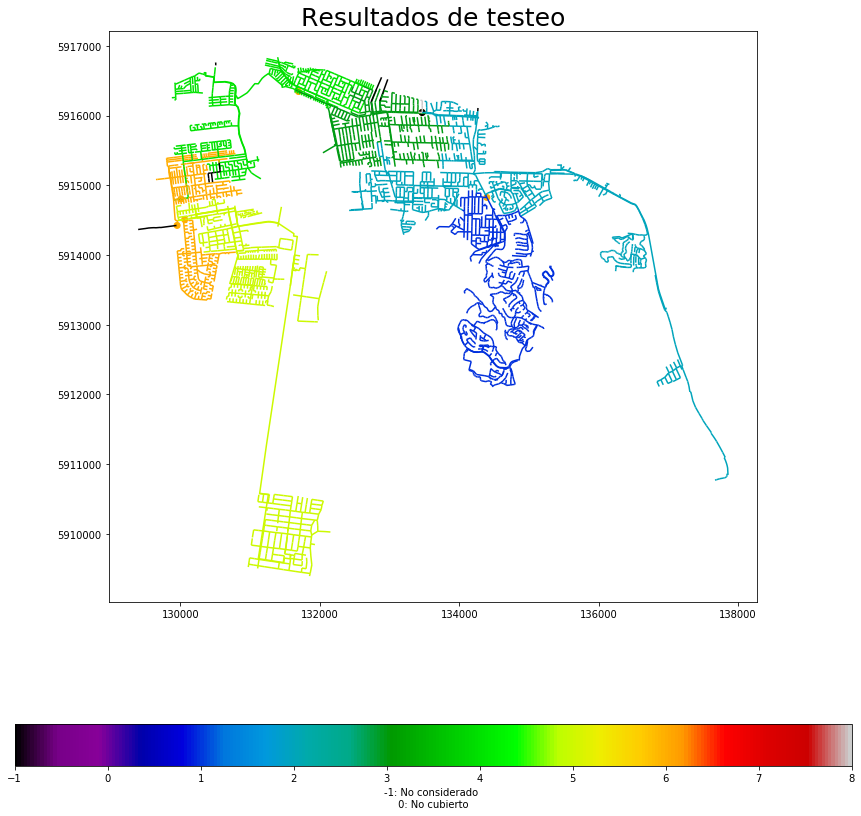

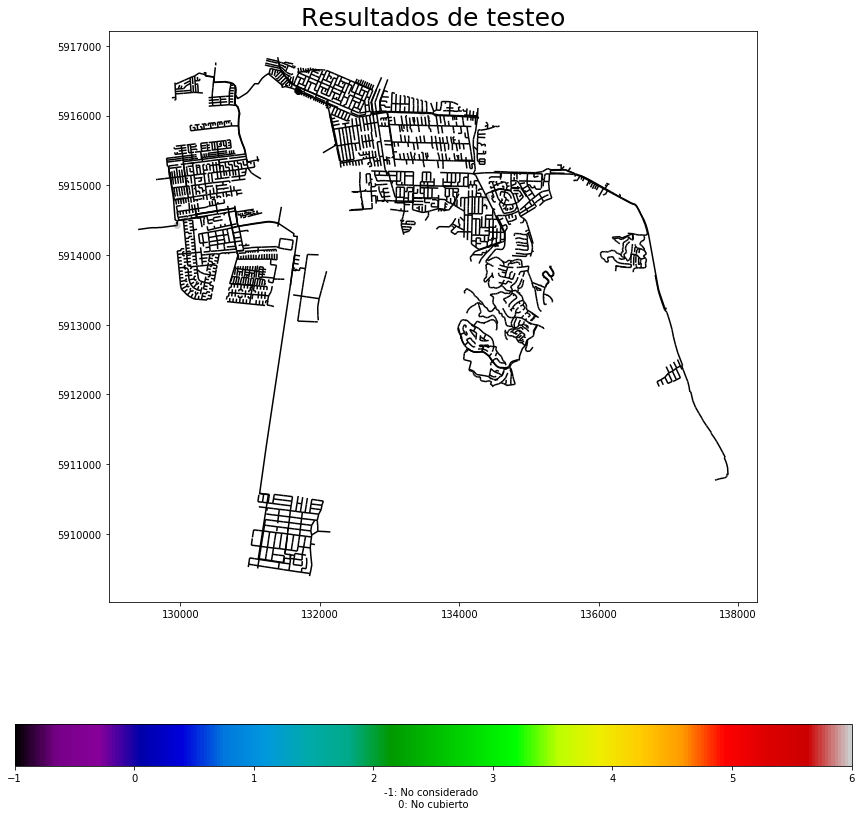

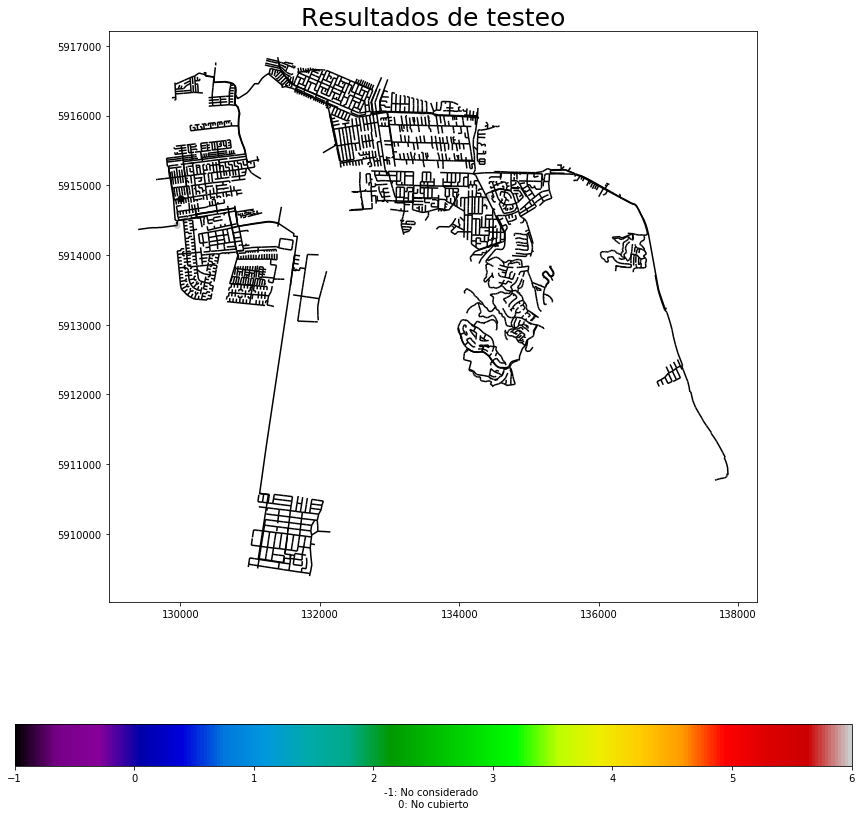

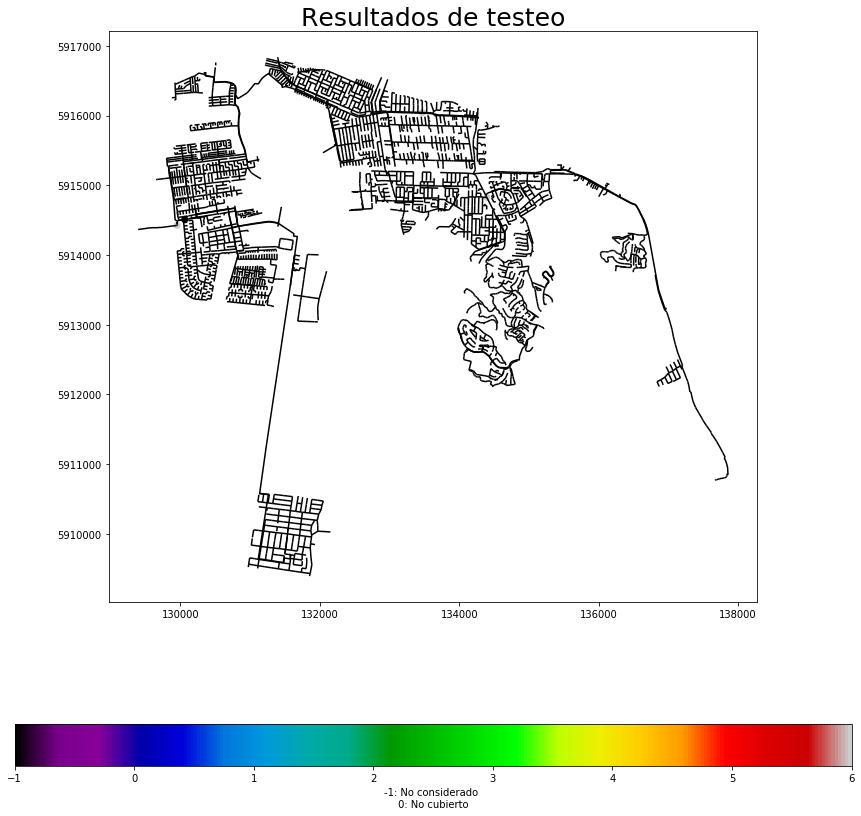

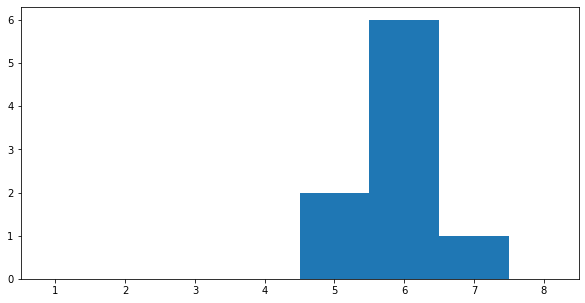

In [249]:
root = 743
iters = []; positions = []; dif = []
S = random.sample(range(N), 10)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(G, W, V, 5, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        V_ = V.copy() # Para diferencias de ideales
        V__ = V.copy() # Para plotear
        visited = sum(V)
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                
                I_ = set(get_ideal(G, V_, u)[::-1])
                V_ = [not (v in I_) for v in range(N)]
                s = u; break
            else:
                V = add_visit_robust(G, V, u)
                add_visit(G, V_, u)
                d = ( sum(V_) - sum(V) ) / (sum(V) - visited)
                if d > 0.5 and t < 3 and (sum(V) - visited) > 60:
                    plot_sample_no_intersections_robust(G, V__, P[::-1], geometry, _id, u)
                    
                    
                
#         down = sum([1 - V_[u] for u in range(N)])
#         up = sum([1 - V[u] for u in range(N)])
#         dif.append(((up - down) / down, t))
        

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))
hist_results(iters)

In [916]:
def find_order(G, V, sample_, s):
    sample = sample_.copy()
    ans = []; Q = deque([]); Q.append(s)
    while Q:
        u = Q.popleft()
        if u in sample:
            ans.append(u)
            sample.remove(u)
        for v in G.predecessors(u):
            if not V[v]:
                Q.append(v)
    return ans

## Comparación GreedyDynamic versus versión robusta
### GreedyDynamic

In [210]:
low = 372
init_P, _ = greedyAppReduceDynamic(G, W, [0] * N, 8, low - 1, 1e8)

Result 1890: 5    acc: 5.0
Result 3967: 7    acc: 6.0
Result 1493: 6    acc: 6.0
Result 1727: 5    acc: 5.75
Result 3494: 6    acc: 5.8
Result 835: 5    acc: 5.666666666666667
Result 277: 8    acc: 6.0
Result 2201: 6    acc: 6.0
Result 303: 5    acc: 5.888888888888889
Result 464: 5    acc: 5.8
Result 3856: 5    acc: 5.7272727272727275
Result 4152: 4    acc: 5.583333333333333
Result 4407: 5    acc: 5.538461538461538
Result 3496: 6    acc: 5.571428571428571
Result 2929: 6    acc: 5.6
Result 1201: 5    acc: 5.5625
Result 616: 7    acc: 5.647058823529412
Result 4009: 7    acc: 5.722222222222222
Result 1331: 5    acc: 5.684210526315789
Result 719: 6    acc: 5.7
Result 3676: 6    acc: 5.714285714285714
Result 4443: 6    acc: 5.7272727272727275
Result 3423: 5    acc: 5.695652173913044
Result 2993: 6    acc: 5.708333333333333
Result 3345: 6    acc: 5.72
Result 701: 5    acc: 5.6923076923076925
Result 2863: 5    acc: 5.666666666666667
Result 1409: 6    acc: 5.678571428571429
Result 3879: 6    a

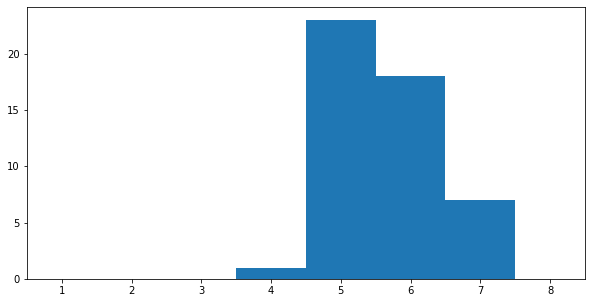

In [250]:
root = 743
iters = []; positions = []; dif = []
S = random.sample(range(N), 50)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic(G, W, V, 5, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        V_ = V.copy() # Para diferencias de ideales
        visited = sum(V)
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                
                I_ = set(get_ideal(G, V_, u)[::-1])
                V_ = [not (v in I_) for v in range(N)]
                s = u; break
            else:
                V = add_visit_robust(G, V, u)
                add_visit(G, V_, u)
                    
                
        down = sum([1 - V_[u] for u in range(N)])
        up = sum([1 - V[u] for u in range(N)])
        dif.append(((up - down) / down, t))
        

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))
hist_results(iters)

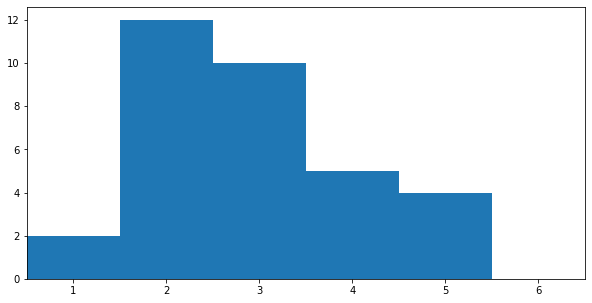

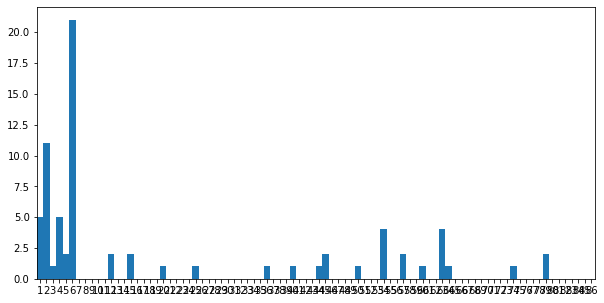

Diferencia relativa promedio: 12.9%
Porcentaje de veces que es el mismo resultado: 69.7%


In [251]:
etapas = [i[1] for i in dif]
etapas_malas = [i[1] for i in dif if i[0] > 0.2]
hist_results(etapas_malas)
dif_ = [i[0] for i in dif]
hist_results([round(100 * i) for i in dif_ if i < 1])
print(f'Diferencia relativa promedio: {round(sum(dif_)/len(dif_) * 100, 1)}%')
print(f'Porcentaje de veces que es el mismo resultado: {round(dif_.count(0)/len(dif_) * 100, 1)}%')

In [255]:
#plot_sample_no_intersections_robust(G, [0] * N, [positions[1], 743], geometry, _id, positions[1])

### GreedyDynamic robusto

In [976]:
low = 372
init_P, sP = greedyAppReduceDynamic_robust(G, W, V, 5, 372, 1e8)

Result 46: 5    acc: 5.0
Result 3586: 5    acc: 5.0
Result 2439: 5    acc: 5.0
Result 1296: 5    acc: 5.0
Result 2843: 5    acc: 5.0
Result 1896: 5    acc: 5.0
Result 1845: 6    acc: 5.142857142857143
Result 1734: 6    acc: 5.25
Result 3843: 5    acc: 5.222222222222222
Result 1690: 5    acc: 5.2
Result 1716: 8    acc: 5.454545454545454
Result 1310: 5    acc: 5.416666666666667
Result 1062: 6    acc: 5.461538461538462
Result 1643: 5    acc: 5.428571428571429
Result 3903: 6    acc: 5.466666666666667
Result 2581: 5    acc: 5.4375
Result 3075: 5    acc: 5.411764705882353
Result 94: 6    acc: 5.444444444444445
Result 3877: 6    acc: 5.473684210526316
Result 2496: 5    acc: 5.45
Result 1914: 6    acc: 5.476190476190476
Result 3439: 5    acc: 5.454545454545454
Result 114: 5    acc: 5.434782608695652
Result 2419: 5    acc: 5.416666666666667
Result 1672: 5    acc: 5.4
Result 4354: 5    acc: 5.384615384615385
Result 1990: 5    acc: 5.37037037037037
Result 465: 5    acc: 5.357142857142857
Result 2

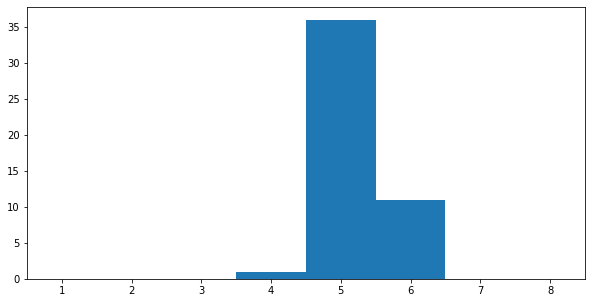

In [977]:
import random

root = 743
iters = []; positions = []; dif = []
S = random.sample(range(N), 50)

for r in S:
    CV = [0 for u in range(N)]

    CV[r] = 1
    Q = deque([]); Q.append(r)
    while Q:
        u = Q.popleft()
        for v in G.successors(u):
            if not CV[v]:
                CV[v] = 1
                Q.append(v)
    V = [0] * N

    R = N; s = 743
    for t in range(100):
        
        R = sum([1 - V[u] for u in range(N)]); P = []; sP = 0
        if t == 0:
            P = init_P
        elif R >= 10:
            low = 0; high = R
            while low != high:
                mid = (low + high) // 2
                P, sP = greedyAppReduceDynamic(G, W, V, 5, mid, 1e8)
                if R - sP < mid:
                    high = mid
                else:
                    low = mid + 1
            P, sP = greedyAppReduceDynamic_robust(G, W, V, 5, low, 1e8)
            if low > 1:
                P_, sP_ = greedyAppReduceDynamic_robust(G, W, V, 5, low - 1, 1e8)
                if abs(sP_ - (low - 1)) < abs(sP - low):
                    P = P_; sP = sP_
        else:
            P, sP = greedyAppReduceDynamic_robust(G, W, V, 5, 1, 1e8)
            
            
        if s not in P:
            P.append(s)
        
        P = find_order(G, V, P, s)
        
        V_ = V.copy()
        for u in P[::-1]:
            if CV[u]:
                I = set(get_ideal(G, V, u)[::-1])
                V = [not (v in I) for v in range(N)]
                
                I_ = set(get_ideal(G, V_, u)[::-1])
                V_ = [not (v in I_) for v in range(N)]
                s = u; break
            else:
                V = add_visit_robust(G, V, u)
                add_visit(G, V_, u)
                
        down = sum([1 - V_[u] for u in range(N)])
        up = sum([1 - V[u] for u in range(N)])
        dif.append(((up - down) / down, t))
        

        size, weight = get_size_weight(G, W, V, s)
        #size, weight = get_size_weight_robust(G, W, V, s)

        if size == 1 or weight <= 200:
            iters.append(t + 1); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            break
        if t == 99:
            iters.append(100); positions.append(r)
            print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
            
print(sum(iters) / len(iters), max(iters))
hist_results(iters)

In [978]:
etapas = [i[1] for i in dif]
etapas_malas = [i[1] for i in dif if i[0] > 0.2]
hist_results(etapas_malas)
dif_ = [i[0] for i in dif]
hist_results([round(100 * i) for i in dif_ if i < 1])
print(f'Diferencia relativa promedio: {round(sum(dif_)/len(dif_) * 100, 1)}%')
print(f'Porcentaje de veces que es el mismo resultado: {round(dif_.count(0)/len(dif_) * 100, 1)}%')

ValueError: max() arg is an empty sequence

## Recomendación de soluciones alternativas
1. Pasar grafo y soluciones
2. Encontrar ideal de cada nodo a través de find_order
3. Para cada solución buscar en un dfs con profundidad < D el nodo que tenga un ideal más similar
4. Adaptar para técnica robusta

In [3]:
def compare_ideals(I1, I2):
    difference = list(set(I1) ^ set(I2))
    ratio = len(difference)/len(I1) * 100
    return ratio

def get_r(List):
    r_ = [i[1] for i in List]
    return max(r_)

def get_q(List):
    r_ = [i[1] for i in List]
    return max(r_)

def update_alternatives(List, node, ratio, options):
    if len(List) < options:
        List.append((node, ratio))
    else:
        r_ = [i[1] for i in List]
        index = r_.index(max(r_))
        List[index] = (node, ratio)
    return List

def by_ratio(elem):
    return elem[1]

def replace(sequence, old, new):
    return [new if x == old else x for x in sequence]

def quality_partition(G, solution, Max = True, Norm_2 = True):
    N = len(G.nodes()); M = 1e10; root = 743
    V = [0] * N
    ordered_solution = find_order(G, V, solution.copy(), root)
    sizes = get_sizes_partition(G, ordered_solution[::-1])

    max_partition = max(sizes) if Max else 0
    norm_2 = sum([i**2 for i in sizes]) if Norm_2 else 0
    
    if not Norm_2:
        return max_partition
    return M * max_partition + norm_2

def get_sizes_partition(G, solution_):
    N = len(G.nodes()); solution = solution_; root = 743
    V = [0] * N
    sizes = []
    if root not in solution:
        solution.append(root)
    for u in solution:
        sizes.append(get_size(G, V, u))
        V, _ = visit(G, V, u)
    #print(sizes)
    return sizes

In [26]:
path = 'data/graph_geom_corrected_cycles.csv'
geometry = gpd.read_file(path, GEOM_POSSIBLE_NAMES="geometry", KEEP_GEOM_COLUMNS="NO")
K = 12
s = 743

In [458]:
low = 0; high = N
while low != high:
    mid = (low + high) // 2
    P, sP = greedyAppReduceDynamic(G, W, [0] * N, K, mid, 1e8)
    if N - sP < mid:
        high = mid
    else:
        low = mid + 1

In [303]:
P, _ = greedyAppReduceDynamic(G, W, [0] * N, K, low - 1, 1e8)

In [4]:
def get_alternatives(G, solution, max_depth, max_dif, options):
    # Inicializamos
    P = solution; D = max_depth; L = max_dif
    if s not in P:
        P.append(s)
    alternatives = {u: [(None, 1e10)] for u in P}
    G_ = G.to_undirected()
    
    # Buscamos el nodo 'cercano' con el ideal más parecido a el original
    for u in P[::-1]:
        V_ = [0] * N
        current_r = get_r(alternatives[u])
        I1 = get_ideal(G, [0] * N, u)
        
        #BFS
        Q = deque([]); Q.append(u)
        while Q:
            u_ = Q.popleft()
            for v in G_.neighbors(u_):
                depth = nx.shortest_path_length(G_, source = u, target = v)
                if not V_[v] and depth <= D:
                    V_[v] = 1; Q.append(v)

                    I2 = get_ideal(G, [0] * N, v)
                    r = compare_ideals(I1, I2)
                    if r < current_r and r < L and v != u:
                        alternatives[u] = update_alternatives(alternatives[u], v, r, options)
                        current_r = get_r(alternatives[u])

        # Ordenamos la lista por prioridad
        alternatives[u].sort(key = by_ratio)
    
    return alternatives
#get_alternatives(G, P, 5, 500, 3)

In [5]:
def get_alternatives_robust(G, solution, max_depth, max_dif, options):
    # Inicializamos
    P = solution; D = max_depth; L = max_dif
    if s not in P:
        P.append(s)
    alternatives = {u: [(None, 1e10)] for u in P}
    G_ = G.to_undirected()
    
    # Buscamos el nodo 'cercano' con el ideal más parecido a el original
    for u in P[::-1]:
        V_ = [0] * N
        current_r = get_r(alternatives[u])
        I1 = get_ideal_robust(G, [0] * N, u)
        
        #DFS
        Q = deque([]); Q.append(u)
        while Q:
            u_ = Q.popleft()
            for v in G_.neighbors(u_):
                depth = nx.shortest_path_length(G_, source = u, target = v)
                if not V_[v] and depth <= D:
                    V_[v] = 1; Q.append(v)

                    I2 = get_ideal_robust(G, [0] * N, v)
                    r = compare_ideals(I1, I2)
                    if r < current_r and r < L and v != u:
                        alternatives[u] = update_alternatives(alternatives[u], v, r, options)
                        current_r = get_r(alternatives[u])

        # Ordenamos la lista por prioridad
        alternatives[u].sort(key = by_ratio)
    
    return alternatives
#get_alternatives_robust(G, P, 5, 100, 3)

In [6]:
def new_get_alternatives(G, solution, max_depth, options, Max = True, Norm_2 = True, s = 744):
    # Inicializamos
    P = solution; D = max_depth
    if s not in P:
        P.append(s)
    alternatives = {u: [(u, 1e100)] for u in P}
    G_ = G.to_undirected()
    
    # Buscamos el nodo 'cercano' con el ideal más parecido a el original
    for u in P[::-1]:
        V_ = [0] * N
        current_q = get_q(alternatives[u])
        Q1 = quality_partition(G, solution, Max, Norm_2)
        
        #BFS
        Q = deque([]); Q.append(u)
        while Q:
            u_ = Q.popleft()
            for v in G_.neighbors(u_):
                depth = nx.shortest_path_length(G_, source = u, target = v)
                if not V_[v] and depth <= D:
                    V_[v] = 1; Q.append(v)
                    
                    new_P = replace(P, u, v)
                    Q2 = quality_partition(G, new_P, Max, Norm_2)
                    if Q2 < current_q and v != u:
                        alternatives[u] = update_alternatives(alternatives[u], v, Q2, options)
                        current_q = get_q(alternatives[u])


        # Ordenamos la lista por calidad de solucion
        alternatives[u].sort(key = by_ratio)
    
    return alternatives

# P, _ = greedyAppReduceDynamic(G, W, [0] * N, K, low - 1, 1e8)
# alternatives = new_get_alternatives(G, P, 5, 3, Max = True, Norm_2 = True)

Comparar primeras soluciones con estas: se mejoran los resultados? 

In [466]:
P, _ = greedyAppReduceDynamic(G, W, [0] * N, K, low - 1, 1e8)
QI = quality_partition(G, P)
Q = []
for node, options in alternatives.items():
    QF = options[0][1]
    dif = (QF - QI) / QI
    Q.append(dif >= 0)
    print(f'Difencia relativa: {round(dif * 100, 8)}%')
print(sum(Q)/len(Q))

Difencia relativa: -5.8e-07%
Difencia relativa: 0.15822731%
Difencia relativa: -5.5e-07%
Difencia relativa: -5.379746%
Difencia relativa: -7.27847975%
Difencia relativa: -5.2e-07%
Difencia relativa: -5e-07%
Difencia relativa: -4.9e-07%
Difencia relativa: -4.9e-07%
Difencia relativa: -4.5e-07%
Difencia relativa: -5e-07%
Difencia relativa: -4.9e-07%
Difencia relativa: -6.1e-07%
0.07692307692307693


### Calidad de solución en base a minimizar máximo

In [469]:
P, _ = greedyAppReduceDynamic(G, W, [0] * N, K, low - 1, 1e8)
QI = quality_partition(G, P, Max = True, Norm_2 =  False)
Q = []
for node, options in alternatives.items():
    new = replace(P, node, options[0][0])
    QF = quality_partition(G, new, Max = True, Norm_2 =  False)
    dif = (QF - QI) / QI
    Q.append(dif >= 0)
    print(f'Mejor original: {QI <= QF}. Difencia relativa: {round(dif * 100, 8)}%')
print(sum(Q)/len(Q))

Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.15822785%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: False. Difencia relativa: -5.37974684%
Mejor original: False. Difencia relativa: -7.27848101%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
Mejor original: True. Difencia relativa: 0.0%
0.8461538461538461


### Calidad de solución en base a norma 2

In [468]:
P, _ = greedyAppReduceDynamic(G, W, [0] * N, K, low - 1, 1e8)
QI = quality_partition(G, P, Max = False, Norm_2 = True)
Q = []
for node, options in alternatives.items():
    new = replace(P, node, options[0][0])
    QF = quality_partition(G, new, Max = False, Norm_2 = True)
    dif = (QF - QI) / QI
    Q.append(dif >= 0)
    print(f'Mejor original: {QI <= QF}. Difencia relativa: {round(dif * 100, 8)}%')
print(sum(Q)/len(Q))

Mejor original: False. Difencia relativa: -0.28647626%
Mejor original: True. Difencia relativa: 0.01494752%
Mejor original: False. Difencia relativa: -0.18926359%
Mejor original: False. Difencia relativa: -0.87749484%
Mejor original: False. Difencia relativa: -0.84297574%
Mejor original: False. Difencia relativa: -0.10699845%
Mejor original: False. Difencia relativa: -0.02032433%
Mejor original: False. Difencia relativa: -0.00408637%
Mejor original: False. Difencia relativa: -0.00172058%
Mejor original: True. Difencia relativa: 0.1496903%
Mejor original: False. Difencia relativa: -0.02709911%
Mejor original: True. Difencia relativa: 0.00129043%
Mejor original: True. Difencia relativa: 0.0%
0.3076923076923077


In [340]:
Original = quality_partition(G, solution, Max = True, Norm_2 = True)
for node, options in alternatives.items():
    print(f'Mejor original: {Original < New}: {Original, New}')
    print(node, options)

3928 [(3927, 5860001737860.0), (3926, 5860001738126.0), (3925, 5860001738940.0), 3928, 3928, 3928]
2994 [(2985, 5780001738686.0), (2986, 5790001739112.0), (2988, 5800001739542.0)]
2054 [(1956, 5860001737242.0), (3382, 5860001737406.0), (3381, 5860001737682.0)]
3308 [(3599, 5860001741790.0), (3268, 5860001741810.0), (2675, 5860001742006.0)]
2139 [(1906, 5860001742314.0), (1905, 5860001742426.0), (2142, 5860001765222.0)]
4200 [(4201, 5860001744250.0), (4202, 5860001745186.0), (4204, 5860001746490.0)]
276 [(3566, 5860001735386.0), (2080, 5860001737642.0), (2081, 5860001737942.0)]
1899 [(1898, 5860001742358.0), (1897, 5860001742514.0), (1902, 5860001757254.0)]
2164 [(2163, 5860001742220.0), (2162, 5860001742238.0), (2147, 5860001759116.0)]
1029 [(1035, 5860001742392.0), (1044, 5860001742582.0), (2151, 5860001742974.0)]
2318 [(2317, 5860001742290.0), (2314, 5860001742390.0), (1881, 5860001742638.0)]
422 [(913, 5860001750750.0), (963, 5860001751026.0), (900, 5860001767586.0)]
2066 [(4411, 58

### Nuevo algoritmo revisando alternativas

In [41]:
def best_replacement(ans, alternatives):
    best = 1e15
    old = None
    new = None
    for node, alt in alternatives.items():
        if alt[0][1] < best:
            best = alt[0][1]; old = node; new = alt[0][0]
    return replace(ans, old, new)

def best_replacement(ans, alternatives):
    return ans
    

In [35]:
def greedyAppReduceDynamic_alternatives(G, W, V_, K, limit, wlim, radio, Max = True, Norm_2 = True):
    
    V = V_.copy(); N = len(V)
    E = {u for u in range(N) if not V[u]}

    ans = []; tot = 0
    while len(ans) < K:
        
        S = [0 for u in range(N)]
        for v in E:
            _, S[v] = get_size_weight(G, W, V, v)
        
        maxv = 0; u = -1
        for v in E:
            s = get_size_precalc(G, S, V, v)
            if s > maxv and s <= limit and S[v] <= wlim:
                u = v
                maxv = s
        if u == -1:
            break
         
        V, x = visit(G, V, u)
        ans.append(u); tot += x
        E.remove(u)
    
    if radio != 0:
        alternatives = new_get_alternatives(G, ans, radio, 1, Max, Norm_2)
        ans = best_replacement(ans, alternatives)
    
    return ans, tot

In [45]:
def simulate_robust_alternatives(G, W, K1, K2, radio, root = 744, Max = True, Norm_2 = True):
    map_prev = {}    
    iters = []; N = len(W); s = root; wlim = 1e8
    init_P, sP = greedyAppReduceDynamic_alternatives(G, W, [0] * N, K1, 372, wlim, radio, Max, Norm_2)
    #init_P, sP  = greedyAppReduceDynamic(G, W, [0] * N, K1, 372, wlim)

    #for r in list(G.nodes()):
    for r in range(1,4000, 10):

        CV = [0 for u in range(N)]

        CV[r] = 1
        Q = deque([]); Q.append(r)
        while Q:
            u = Q.popleft()
            for v in G.successors(u):
                if not CV[v]:
                    CV[v] = 1
                    Q.append(v)

        V = [0] * N

        R = N
        for t in range(100):
            
            R = N - sum(V); P = []; sP = 0
            
            nn = 0
            for i in range(N):
                if V[i]:
                    nn += 2**i
            
            if t == 0:
                P = init_P
            elif nn in map_prev.keys():
                P = map_prev[nn]
            else:
                if R >= 10:
                    low = 0; high = R
                    while low != high:
                        mid = (low + high) // 2
                        P, sP = greedyAppReduceDynamic(G, W, V, K2, mid, wlim)
                        if R - sP < mid:
                            high = mid
                        else:
                            low = mid + 1
                    P, sP = greedyAppReduceDynamic_alternatives(G, W, V, K2, low, wlim, radio, Max, Norm_2)
                    #P, sP = greedyAppReduceDynamic(G, W, V, K2, low, wlim)

                    if low > 1:
                        P_, sP_ = greedyAppReduceDynamic_alternatives(G, W, V, K2, low - 1, wlim, radio, Max, Norm_2)
                        #P_, sP_ = greedyAppReduceDynamic(G, W, V, K2, low - 1, wlim)
                        if abs((R - sP_) - (low - 1)) < abs((R - sP) - low) or (len(P) == 1 and sP == R):
                            P = P_; sP = sP_
                else:
                    P, sP = greedyAppReduceDynamic_alternatives(G, W, V, K2, 1, wlim, radio, Max, Norm_2)
                    #P, sP = greedyAppReduceDynamic(G, W, V, K2, 1, wlim)
                map_prev[nn] = P
             
            
            
            if sum([CV[u] for u in P]):
                V_ = [-1 * V[u] for u in range(N)]
                for u in P:
                    if CV[u]:
                        I = get_ideal(G, V, u)
                        for v in I:
                            V_[v] += 1
                sum_cv = sum([CV[u] for u in P])
                V = [ V_[i] != sum_cv for i in range(N)]
            
            for u in P:
                if not CV[u]:
                    I = get_ideal_robust(G, V, root, u)
                    for v in I:
                        V[v] = 1

                        
            size = N - sum(V)
            weight = sum([W[u] for u in range(N) if not V[u]])
            
            print(size, weight, P)
            if size == 1 or weight <= 200:
                iters.append(t + 1)
                print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")
                break
            if t == 99:
                print(P)
                iters.append(100)
                print(f"Result {r}: {iters[-1]}    acc: {sum(iters) / len(iters)}")

    print(sum(iters) / len(iters), max(iters))
    hist_results(iters)
    return iters

In [46]:
iters = simulate_robust_alternatives(G, W, 8, 5, 1, Max = False, Norm_2 = True)

388 12315.445551372493 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [1024, 1812, 2781, 151, 144, 744]
Result 1: 2    acc: 2.0
388 12315.445551372493 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [1024, 1812, 2781, 151, 144, 744]
Result 11: 2    acc: 2.0
567 17811.13247223565 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [109, 3131, 4326, 2140, 3563, 744]
Result 21: 2    acc: 2.0
388 12315.445551372493 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [1024, 1812, 2781, 151, 144, 744]
Result 31: 2    acc: 2.0
388 12315.445551372493 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [1024, 1812, 2781, 151, 144, 744]
Result 41: 2    acc: 2.0
567 17811.13247223565 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [109, 3131, 4326, 2140, 3563, 744]
Result 51: 2    acc: 2.0
567 17811.13247223565 [3351, 1433, 3309, 1819, 1905, 2152, 2148, 744]
0 0 [109, 3131, 4326, 2140, 3563, 744]
Result 61: 2    acc: 2.0
567 17811.13247223565 [3351, 1433, 3309, 1819, 1905, 2152, 2148

KeyboardInterrupt: 

In [ ]:
corrected = [ i for i in iters if i != 100]
sum(corrected) / len(corrected), max(corrected)

## Pedido SEREMI


In [139]:
#greedyAppReduceDynamic_alternatives(G, W, [0] * N, 8, 372, 1e8, 0, True, False) == greedyAppReduceDynamic(G, W, [0] * N, 8, 372, 1e8)


In [10]:
path = 'data/graph_geom_corrected_cycles.csv'
csv_grafo = pd.read_csv(path, sep=';')


path_pesos = 'data/pesos_tapas.csv'
pesos = pd.read_csv(path_pesos)

#out = {15190, 1003206, 16503, 15004, 14062, 13735, 1003167, 1003744, 1003746, 1003950, 13730, 13731, 13732, 13733, 15131, 16094, 16095, 131099}
out = {1003950, 15004, 15131, 1003744, 15190, 1003746, 13730, 1003167, 13731, 13732, 13733, 14062, 1003206, 16503, 13735, 16094, 16095}

S = set()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        S.add(origin)
        S.add(dest)

S = list(S)
id_ = {}; _id = {}; l = 0
for u in S:
    id_[u] = l; _id[l] = u
    l += 1

G = nx.DiGraph()
for index, row in csv_grafo.iterrows():
    origin = row['self']
    dest = row['other']
    if origin not in out and dest not in out:
        G.add_edge(id_[origin], id_[dest])
        
N = l

W = [0] * N

for u in range(N):
    if pesos[pesos['ID_tapa'] == _id[u]].shape[0] >= 1:  ## tomamos primera columna con el id, si no hay peso = 0
        W[u] = pesos[pesos['ID_tapa'] == _id[u]].iloc[0]['per_predio']

In [427]:
def get_size_robust(G, V_, node):
    
    N = len(V_)
    
    if node == root:
        return N
    
    V = [0] * N
    
    ans = 1
    V[root] = 1; Q = deque([root]);
    while Q:
        u = Q.popleft()
        for v in G.predecessors(u):
            if (not V[v]) and v != node:
                V[v] = 1; ans += 1
                Q.append(v)

    return N - ans

In [8]:
muestras = [15671, 13934, 13896, 13923, 13949, 15996, 14104, 13932, 131454, 14791, 14930, 15487, 15720]
sample = find_order(G, [0] * N, [id_[i] for i in muestras], 744)
#plot_sample_no_intersections(G, [0] * N, sample[::-1] , geometry, _id)

In [440]:
sample = find_order(G, [0] * N, [id_[i] for i in muestras], 744)
V = [0] * N
root = 744
ideal_sizes = [(get_size_robust(G, V, node), get_size(G, V, node)) for node in sample]
ideal_sizes = [(i,j, f'{round(i/j *100, 1)}%') for i, j in ideal_sizes]
node_sizes = {_id[node]: results for node, results in zip(sample, ideal_sizes)}
node_sizes

{13934: (4576, 4576, '100.0%'),
 14104: (252, 252, '100.0%'),
 13949: (264, 296, '89.2%'),
 15720: (316, 365, '86.6%'),
 13932: (200, 232, '86.2%'),
 13923: (310, 324, '95.7%'),
 14930: (146, 166, '88.0%'),
 131454: (290, 2502, '11.6%'),
 15996: (324, 333, '97.3%'),
 15671: (1100, 1110, '99.1%'),
 13896: (10, 91, '11.0%'),
 14791: (750, 750, '100.0%'),
 15487: (214, 295, '72.5%')}